# Calibrated ChIP-seq Analysis

Pileup files contain data in the following format (numbered by column in pileup data):<br>
<br>
1. Chromosome name
2. Position on the chromosome
3. Reference base at this position
4. Number of reads covering this position.
5. Read bases. This encodes information on matches, mismatches, indels, strand, mapping quality, and starts and ends of reads.
6. Base qualities, encoded as ASCII characters.
7. Alignment mapping qualities, encoded as ASCII characters.
8. Other details

This tool grabs the desired data (number of reads for each chromosome position) from pileup files from a single or multiple samples (note samples do not have to be from the same experiment) and assigns a value of zero to chromosome positions missing ChIP-seq read data. This data is then calibrated, further processed and plotted for visualisation.

## Import dependencies

These are required for the script to run

In [1]:
from __future__ import print_function
import re
from os import listdir
from os.path import isfile, join
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import math
from tqdm import tqdm
import json
import matplotlib.cm as cm
import seaborn as sns
import matplotlib.colors as mcolors
from intermine.webservice import Service
import roman
import warnings
import csv
from statistics import mean
from statsmodels.nonparametric.smoothers_lowess import lowess
import scipy.interpolate
import pickle

## Specify inputs

### Set path

Tells the script which look at to find the desired pileup files (note, only files immediately visible in that folder will be analysed, files in folders stored within that folder will not be included in the analysis). Leave as './' if running the script from the folder containing the desired pileup files.

In [2]:
path = './'

### Specify which samples should be analysed
Give a list of sample names if not all samples present in the desired directory/already processed dataframe should be included. If all samples should be included, set as an empty list.

In [3]:
use_samples = []

#### Use pre-processed data

If the script has previously been run before for the desired samples and the data has been saved as "processed_chip_data" in hdf5 format, rather than re-running the section of the script that produces the dataframe, use the saved dataframe. This saves time and doesn't waste computational power reprocessing the data. Note, the script doesn't check to see if there is already a file named processed_chip_data as this may be present, but you may want to change which pileups should be analysed in that folder, in which case the processed_chip_data file will be overwritten with the dataframe containing the changed pileup data.

In [4]:
use_pre_processed_data = True

#### Comparator
When creating relative plots, all samples are compared to a given sample. The comparator sample is specified here.
Note, these samples must have the same name as the filename (minus the .pileup), if you do not wish to include a comparator set the variable name to "" (leave it as an empty string)

In [5]:
comparator = "sync_t=15_IP"

In [6]:
if not isinstance(comparator, str):
    raise Exception('Error, comparator has to be a string')

#### Save averaged data

The sliced data for feature types can be saved as a csv so that it can be used without having to re-analyse the data (to read it in use pd.read_csv(csv_file_name, index_col=0)). It can also be readily manipulated in this form by combining it with data from other samples. The csv can also be opened in excel or other applications for analysis or visualisation if desired.

In [7]:
save_averaged_data = False

#### Use pre-calculated occupancy ratio values

Occupancy ratios are normally automatically calculated from the text files contianing alignment data, however, if the text files have been lost but the occupancy ratios are known or if you want to calculate the occupancy ratio differently, then occupancy ratios can be manually inputed (occupancy ratios must be integers or floating point numbers). Occupancy ratios can be given as a dictionary of values where the keys are the samples.
Example of how to enter data: 
occupancy_ratios = {
    "sync_t=15_IP": 0.14902806741899566, 
    "sync_t=30_IP": 0.30683295210426165, 
    "sync_t=45_IP": 0.2702122240919067, 
    "sync_t=60_IP": 0.28731368839359883
    }

In [8]:
use_pre_calculated_ORs = False

if use_pre_calculated_ORs:
    occupancy_ratios = {}

#### Define sample order
Samples are normally processed and therefore plotted in lexographical order, this might give undesirable sample ordering in figure legends. To avoid this, specificy which order samples should be processed.  
An example of what sample_order would look like is:     
sample_order = {'t_0_IP':1,'t_15_IP':2, 't_30_IP':3}

Ordering samples is not necessary, if it is not desired then leave sample order as an empty dictionary. 

In [9]:
sample_order = {}

In [10]:
for val in sample_order.values():
    if not isinstance(val, int):
        raise Exception('Error, order position must be given as an integer')

### Desired plots
Specify which plots should be generated and parameters for generating each plot/

#### Centromere plots

Align ChIP-seq data around the centromeres for each chromosome and average all chromosome centromeres.

Relative centromere plots show the read number at each position around the centromere for each sample relative to a given sample expressed as percentage (the comparator sample is specified above). 

Plotting each sample separately and relative plots only work if there is more than 1 sample present.

In [11]:
cen_plot = True  #plot all samples on the same plot
cen_plot_each_sample = True  #plot samples on separate plots 
relative_to_comparator = True  #plot all samples relative to a given sample
cen_filter_size_left = -30000  #number of bases left of centromere included
cen_filter_size_right = 30000  #number of bases right of centromere included
cen_window_len = 250  #size of moving average window

#### Plot each chromosome
Plot ChIP-seq data for all positions on each chromosome separately

Plotting data for all samples for a given chromosome on each plot and relative plots only work if there is more than 1 sample present. 

In [12]:
plot_individual_chr = True  #plot all chromosomes for each sample separately
plot_all_chr_each_sample = True  #plot all samples on the same chromosome plot
each_chr_rel_to_comp = True  #plot all samples on the same chromosome plot
#relative to a comparator sample expressed as change in read number
individual_chr_window_len = 1000  #size of moving average window

#### Plot around pericentromeric border regions

Pericentromeric regions are bordered by pairs of convergent genes. These convergent gene pairs are termed pericentromeric borders. Pericentromeric borders position cohesin (see https://doi.org/10.1038/s41586-020-2244-6 for more information). 

In [13]:
plot_pericen_borders = True  #plot pericentromeric border regions
border_filter = 3000  #number of bases around pericentromeric borders included
pericen_window_len = 50  #size of moing average window

#### Plot around ARSs

Each around ARS slice is binned to reduce the number of data points so that heatmaps can be generated. 

Around ARS slices are also binned based on an ARS property such as ARS efficiency, all ARSs in each bin are avergaed, each averaged bin data is then plotted. ARS property information is from https://doi.org/10.1016/j.celrep.2013.10.014/.

If there are multiple samples then difference plots can be made. The samples that should be compared in difference plots can be specified using a list of tuples (e.g. [('t=15', 't=0'), ('t=30', 't=15')], alternatively, specifying 'sequential' will subtract the adjacent sample in the sample order, whilst specifying 'relative' will compare all samples to the comparator sample specified below. Difference plots can either be given as a change in read number or a change in percent. To avoid making difference plots, leave diff_pairs as an empty list.

In [14]:
around_ARSs = True  #plot around ARSs
ARS_bins = 300  #number of bins around ARS positions are sorted into
ARS_properties_bins = 5  #size of rolling window for around ARSs plots
ARS_property = 'Time-course efficiency' #ARS property to bin ARSs by
around_ARS_start_slice = -40000  #number of bases left of ARS included
around_ARS_end_slice = 40000  #number of bases right of ARS included
around_ARS_window_len = 10  #size of moving average window 
around_ARS_diff_pairs = 'sequential'  #difference pairs
around_ARS_diff_percent=False  #give change as percent or absolute read number

#### Overlay DNA content changes onto changes in cohesin read number for around ARSs

In [15]:
overlaid_ARS_data = True
DNA_data = 'bin_around_ARS_sample_avgs_wt_DNA_5_bins.pkl'
IP_data = 'bin_around_ARS_sample_avgs_wt_cohesin_5_bins.pkl'
IP_target = 'cohesin'
ARS_overlaid_binned = True
ARS_overlaid_start = int(-60000/1000)
ARS_overlaid_end = int(60000/1000)
ARS_overlaid_nrows=2
ARS_overlaid_ncols=5

#### Plots around ARSs meeting certain criteria 
Each origin is described by four properties outside of ARS position: efficiency (proportion of cells the origin is active), competence (p, proportion of cells in which an origin is licensed), median activation time (T1/2), and the width of the activation distribution (Tw). The lower and upper limits for each property are specified here. To include all ARSs for a given property, set the lower value to less than or equal to 0 and for efficiency and competency the upper value as equal to or greater than 1, whereas for firing time and distribution set the upper value to 50 or greater.

If there are multiple samples then difference plots can be made. The samples that should be compared in difference plots can be specified using a list of tuples (e.g. [('t=15', 't=0'), ('t=30', 't=15')], alternatively, specifying 'sequential' will subtract the adjacent sample in the sample order, whilst specifying 'relative' will compare all samples to the comparator sample specified below. Difference plots can either be given as a change in read number or a change in percent. To avoid making difference plots, leave diff_pairs as an empty list.

In [16]:
around_ARS_criteria = True  #plot ARS meeting certain criteria
ARS_efficiency_lower = -1
ARS_efficiency_upper = 2
ARS_firing_time_lower = -1
ARS_firing_time_upper = 50
ARS_competency_lower = -1
ARS_competency_upper = 2
ARS_activation_distribution_lower = -1
ARS_activation_distribution_upper = 50
ARS_criteria_bins = 300  #number of bins ARS criteria positions are sorted into
ARS_criteria_window_len = 10  #size of moving average window 
ARS_criteria_start_slice = -40000  #number of bases left of ARS included
ARS_criteria_end_slice = 40000  #number of bases right of ARS included
ARS_criteria_diff_pairs = 'sequential'
ARS_criteria_diff_percent=False

#### Plot data around ORF start codons

In [17]:
align_on_ORF_5_prime = True  #plot around start codons
analyse_non_convergent_5_prime = True  #plot for only-non-convergent genes
ORF_5_prime_start_slice = -500  #number of bases left of start codon included
ORF_5_prime_end_slice = 500  #number of bases right of start codon included
ORF_5_prime_window_len = 50  #size of moving average window

#### Plot data around ORF stop codons

In [18]:
align_on_ORF_3_prime = True  #plot around stop codons
analyse_non_convergent_3_prime = True  #plot for only-non-convergent genes
ORF_3_prime_start_slice = -500  #number of bases left of stop codon included
ORF_3_prime_end_slice = 500  #number of bases left of stop codon included
ORF_3_prime_window_len = 50  #size of moving average window

#### Plot Open Reading Frames (ORFs)

Since ORFs vary in length, each ORF slice is binned before averaging to convert ORF slices into relative positions for comparison. ORFs are binned based on their transcription rates. TR_ORF_bins specifies what the transcription rate bin boundaries should be (molecules RNA produced per hour).

In [19]:
plot_ORFs = True  #plot ORFs
TR_non_conv = False #plot for only-non-convergent genes
ORF_bins = 100  #number of bins ORF positions are sorted into
ORF_window_len = 1  #size of moving average window
TR_ORF_bins = [0, 2, 4, 8, 16, 32, 256]

#### Plot Convergent Gene Pairs
Data is plotted around the midpoint of convergent genes. The midpoint is defined as the middle position between the stop codons of the two ORFs. Data around convergent gene midpoints are binned based on transcription rates of the gene pairs. Note, only convergent gene pairs where the transcription rates of both genes in the pair fall within a given bin are considered. TR_conv_gene_bins specifies what the transcription rate bin boundaries should be (molecules RNA produced per hour).

In [20]:
plot_convergent_genes = True  #plot convergent gene pairs
mid_conv_gene_filter = 3000  #num bases around conv gene midpoints included
mid_conv_gene_window_len = 50  #size of moving average window,
TR_conv_gene_bins = [0, 2, 4, 8, 16, 32, 256]

#### Plot Divergent Gene Pairs
Data is plotted around the midpoint of divergent genes. The midpoint is defined as the middle position between the start codons of the two ORFs. Data around divergent gene midpoints are binned based on transcription rates of the gene pairs. Note, only divergent gene pairs where the transcription rates of both genes in the pair fall within a given bin are considered. TR_div_gene_bins specifies what the transcription rate bin boundaries should be (molecules RNA produced per hour).

In [21]:
plot_div_genes = True  #plot divergent gene pairs
mid_div_gene_filter = 3000  #num bases around div gene midpoints included
mid_div_gene_window_len=50  #size of moving average window,
TR_div_gene_bins = [0, 4, 8, 16, 256]

#### Plot tRNA genes

Data around the start, end and across the entire tRNA genes are plotted. For tRNA genes, because the length varies, the data is binned to convert absolute position to relative position for comparison.

In [22]:
plot_tRNA_genes = True #plot tRNA genes
tRNA_5_prime_start_slice = -400  #number of bases left of tRNA start site included
tRNA_5_prime_end_slice = 400  #number of bases right of tRNA start site included
tRNA_3_prime_start_slice = -50  #number of bases left of tRNA end site included
tRNA_3_prime_end_slice = 400  #number of bases right of tRNA end site included
tRNA_window_len = 20  #size of moving average window for around start and end sites
tRNA_gene_bins = 30  #number of bins tRNA gene positions are sorted into
tRNA_gene_window_len = 2  #size of moving average window for whole tRNA genes

### Required values

In [23]:
chr_lens = {
    'chrI': 230218,
    'chrII': 813184,
    'chrIII': 316620,
    'chrIV': 1531933,
    'chrV': 576874,
    'chrVI': 270161,
    'chrVII': 1090940,
    'chrVIII': 562643,
    'chrIX': 439888,
    'chrX': 745751,
    'chrXI': 666816,
    'chrXII': 1078177,
    'chrXIII': 924431,
    'chrXIV': 784333,
    'chrXV': 1091291,
    'chrXVI': 948066
    }

chr_order={
    "chrI": 1, 
    "chrII": 2, 
    "chrIII": 3,
    "chrIV": 4,
    "chrV": 5,
    "chrVI": 6,
    "chrVII": 7,
    "chrVIII": 8,
    "chrIX": 9,
    "chrX": 10,
    "chrXI": 11,
    "chrXII": 12,
    "chrXIII": 13,
    "chrXIV": 14,
    "chrXV": 15,
    "chrXVI": 16
    }
#values from the Saccharomyces Genome Database (SGD) 

### Functions

In [24]:
def get_occupancy_ratios(df, sample):    
    """Calculates the occupancy ratio for each sample
    
    Grabs the appropriate values from the dataframe of the text files 
    and performs the appropriate calculations to determine the occupancy
    ratios for each sample present. For more information about the occupancy
    ratio (including its derivation) see https://doi.org/10.1093/nar/gkv670.
    
    The values in the dataframe used are how many reads aligned once and more 
    than once for both C. glabrate and S. cerevisiae in IP and WCE samples
    
    The error checks that there are 2 files for each sample (IP and WCE).
    
    Args:
        df: dataframe of all the lines in the text files created by 
        script2.sh containing information about alignment data
        sample
        sample: name of text file contianing alignment data for that sample
        (string)
    
    Returns:
        A dictionary of IP efficiencies and OR values
    """

    if (len(df.loc[sample]) != 2 or 'IP' not in str(df.loc[sample].index) or 
        'WCE' not in str(df.loc[sample].index)):
        raise Exception('''
        Error: Insufficient data to calculate the occupancy ratios, ensure 
        both the IP and WCE text files containing the read alignment data 
        for the sample are present. Also ensure that the sample files are 
        labelled with IP and WCE
        ''')
        
    for i in range(2):
        if 'IP' in df.loc[sample].iloc[i].name:
            IP_cgla_total = (int(df.loc[sample].iloc[i][3].split()[0])
            + int(df.loc[sample].iloc[i][4].split()[0]))
            
            IP_scer_total = (int(df.loc[sample].iloc[i][9].split()[0])
            + int(df.loc[sample].iloc[i][10].split()[0]))
        
        elif 'WCE' in df.loc[sample].iloc[i].name:
            WCE_cgla_total = (int(df.loc[sample].iloc[i][3].split()[0])
            + int(df.loc[sample].iloc[i][4].split()[0]))
            
            WCE_scer_total = (int(df.loc[sample].iloc[i][9].split()[0])
            + int(df.loc[sample].iloc[i][10].split()[0]))
            
    IP_efficiency = (IP_scer_total/WCE_scer_total) / (IP_cgla_total/WCE_cgla_total)
    # IP_efficiency is the OR in the original paper
    OR = 1000000 * IP_efficiency / IP_scer_total  
    # normalised OR, reads converted to reads per million reads      
    IP_efficiencies[f'{sample}IP'] = IP_efficiency
    occupancy_ratios[f'{sample}IP'] = OR 


def sort_by_chr(file):
    """Sort files by chr number
    
    Chromosome IX is noramlly processed before chr V as chr V lexicographically 
    comes after chr IX. To overcome this, the roman numerals are converted
    into integers and the chromosomes can then be sorted based on the integer
    of the chromosome number
    
    Args:
        file: name of pileup file (string)
    
    Returns:
        The sample name with the chromosome number as an integer
    """
    chr_name = re.split("chr",file)[1].replace('.pileup','')
    sample_name = re.split("chr",file)[0]
    return sample_name, roman.fromRoman(chr_name)


def sort_by_sample(file):
    """Orders files by sample order
    
    Sample order is defined in a dictionary, without this samples are ordered
    lexicographically which may not give the desired result, especially when it 
    comes to substracting sequential samples from each other in difference plots
    
    Args:
        file: name of pileup file (string)
    
    Returns:
        The position in the order for a sample 
    """
    sample_name = re.split("chr", file)[0]
    return sample_order[sample_name]

    
def fill_gaps(
        chr_name,
        sample_name,
        base_lower,
        base_upper,
        processed_pileups):
    """Fills gaps in pileups
    
    Fills in missing chromosome positions in the pileup with a read number of 0.
    
    Removes aligned rDNA repeats from chrXII which give an artificially inflated 
    peak. Values in this region are set to not a number (nan),  so that they are
    ommited from calculations (such as mean). A value such as 0 would contribute 
    to the mean. This would be incorrect as this is not the actual read number 
    at this position. Using nan also means on plots, the rDNA repeat region will 
    be blank making it clearer that this data has been filtered out.
    
    Chromosome library is a dictionary of each chromosome position (key) and its
    read number (value). This is used over a dataframe as looping in pandas is 
    very slow.
    
    Dataframes containing data for each pileup are stored separately in a 
    dictionary before concatenating, rather than appending each pileup to the 
    same dataframe as this is much faster.
    
    Args:
        df: dataframe of pileup data
        sample_name: name of experimental sample (string)
        chr_name:name of chromosome in sample being processed (string)
        base_lower:starting chromosome position (integer)
            note indexing here should start at 1
        base_upper:final chromosome position (integer)
        processed_pileups:(empty) dictionary of sequencing data pandas series
    
    Returns: 
        A dictionary of pandas series containing filled in read numbers for each 
        chromosome position in each chromosome in each sample.
    """
    df = pd.read_csv(
        join(path, file), delimiter="\t", header=None, usecols=[1, 3], 
        dtype={1: np.int32, 3: np.int16}, quoting=csv.QUOTE_NONE, 
        encoding='utf-8'
        )
    chromosome_library = dict(zip(df[1], df[3]))
    chr_pos_reads = pd.Series([
        chromosome_library.get(base, 0) for base in 
        range(int(base_lower), int(base_upper))
        ])
    chr_pos_reads.index = np.arange(base_lower, base_upper)
    if chr_name == 'chrXII':
        chr_pos_reads.iloc[450000:475000] = np.nan
    processed_pileups[(sample_name, chr_name)] = chr_pos_reads
    #this method is faster than using reindex on a series with 
    #a fill value of 0
    
    
def calc_diff(data, diff_pairs, diff_percent=True):
    """Calculates the difference between samples
    
    The difference can be expressed as absolute change in read or as a 
    percentage change 
    
    Args:
        data: Dictionary of data slices from multiple samples
        diff_pairs: List of tuples specifying which samples should be compared.
            Default settings include subtracting samples adjacent to each 
            other in the data passed in ('sequential') or comparing all 
            samples to a comparator ('relative').
        diff_percent: Boolean for whether difference data should be calculated
            as a percent change or absolute change in read number
    Returns:
        Dictionary containing difference data
    """
    if diff_pairs == 'sequential':
        diff_pairs = list(zip(list(data), list(data)[1:]))
    elif diff_pairs == 'relative':
        diff_pairs = [
            (comparator, sample) for sample in list(data) 
            if sample != comparator
        ]
    
    diff_data = {}
    for lower, higher in diff_pairs:
        if diff_percent:
            difference = (100*(data[higher]-data[lower])/data[lower])
        else: 
            difference = data[higher]-data[lower]
            
        difference.replace(np.inf, np.nan, inplace=True)
        if not difference.empty:
            diff_data[f'{higher}_minus_{lower}'] = difference

    return diff_data

    
def plot_data(
    data,
    start,
    end,
    save_name,
    binned=False,
    num_bins=False,
    relative=False,
    comparator=None,
    difference=False,
    include_num=True,
    sample_slices=None,
    window_len=250,
    lw=1,
    xsize=10,
    ysize=3,
    dpi=300,
    label=True,
    title=None,
    xlabel=None,
    loc=[1.05, 0],
    ylabel='Number of Reads'):
    """Creates and formats a single plot of y versus x
    
    Plots data from a single or multiple samples on the same plot.
    Can either plot data as is, or do plots relative to a comparator
    (what percentage are samples compared to the comparator sample) 
    or difference plots
    
    Adds features to a plot such as the title, labels etc.
        
    Args:
        data: dictionary containing series of numeric values 
            representing the y values for the samples present
        start: start position of chromosome feature (int)
        end: end position of chromosome feature (int)
        save_name: name png should be saved as (str)
        binned: Boolean for whether input data was rescaled by binning
        num_bins: Number of bins used to rescale data
        relative: Boolean for whether data should be compared to 
            comparator to give a relative plot
        comparator: name of sample which other samples should be 
            compared to
        difference: Boolean for whether difference data is being 
            plotted
        include_num: Boolean for whether the number of slices 
            present should be included
        sample_slices: dictionary of dataframes containing all the 
            slices for a given feature. 
        window_len: length of rolling window (int)
        lw: width of line plotted (float)
        xsize: width of plot in inches (int)
        ysize: height of plot in inches (int)
        dpi: The resolution of the figure in dots-per-inch.
        label: Boolean for whether figure labels should be given
            to help identify which line represents which sample
        title: title of plot (str)
        xlabel: label of x axis (str)
        loc: position of legend (list of integers)
        ylabel: label of y axis (str)
    
    Returns:
        formatted plot
    """
    if data != {}:
        fig = plt.figure(figsize=(xsize,ysize), dpi=dpi)
        axes = fig.add_axes([0, 0, 1, 1])
        if binned:
            index = np.linspace(start, end, num=num_bins)
        else:
            index = np.arange(start, end+1)
        
        if include_num:
            num_slices = None
            for sample in sample_slices:
                if num_slices == None:
                    num_slices = len(sample_slices[sample].columns)
                elif len(sample_slices[sample].columns) != num_slices:
                    num_slices = 'individual'
        if include_num and num_slices != 'individual': 
            title = f'{title} \n n = {num_slices}'
        
        for sample in data:  
            if not relative:
                results = data[sample]
            if relative:
                results = pd.DataFrame(
                    100*data[sample]/data[comparator]
                    )  #if dividing by 0 then gives nan which is not plotted
            
            if difference:
                sample_colour = sample.split('_minus')[0] 
                #colour will always be higher sample
            else:
                sample_colour = sample
            
            label_name = sample.replace('_IP', '').replace('_',' ')
            if include_num and num_slices == 'individual':
                label_name = f'{label_name}, n = {len(sample_slices[sample].columns)}' 
                
            axes.plot(
                index,
                results.rolling(
                    window_len, center=True, 
                    min_periods=int(window_len/2) #not 1 in case have outliers
                    ).mean(),
                label=label_name,
                color=sample_colour_dict[sample_colour],
                linewidth=lw
                )

            if label:
                axes.legend(loc=loc)
            
            if binned: 
                x_lower = start + int(((end - start)/num_bins)*(window_len/2))
                x_upper = end - int(((end - start)/num_bins)*(window_len/2))
            else:
                x_lower = start + int(window_len/2)
                x_upper = end - int(window_len/2)
            
            axes.set_xlim(x_lower, x_upper)
            axes.set_xlabel(xlabel)  # axes.set_xlabel(xlabel, fontsize = 10)
            axes.set_ylabel(ylabel.replace('_IP', '').replace('_',' '))
            axes.set_title(title.replace('_IP', '').replace('_',' '));
        fig.savefig(join(path,f'{save_name}.png'), bbox_inches='tight')
        
#min periods is min number of observations in window required to have a value 
#min periods is not set to None as allows as it also works for relative plots 
#when dividing by zero - the values are simply ignored in the mean calculation
#however, the start and ends of a plot are ignored as the mean is calculated 
#using fewer chromosome positions than elsewhere - the value of nan given to 
#many of the positions at the edges is not correct, whereas it is more correct
#for relative plots when dividing by zero


def individual_subplots(
    i, 
    n,
    start,
    end,
    results,
    num_bins=False,
    binned=False,
    window_len=1,
    lw=1,
    difference=False,
    label=None,
    title=None,
    xlabel=None,
    colour=None,
    loc=[1.05,0],
    ylabel='Number of Reads'):
    """Formats each subplot
    
    Adds features to each subplot such as the title, labels etc.
        
    Args:
        i and n: integers used for indexing the subplot grid
        start: start position of chromosome feature (int)
        end: end position of chromosome feature (int)
        results: series of numeric values representing the y values
        binned: Boolean for whether input data was rescaled by binning
        num_bins: Number of bins used to rescale data
        lw: width of line plotted (float)
        label: name of data being passed in (str)
        title: title of plot (str)
        xlabel: label of x axis (str)
        colour: colour of line (str)
        loc: position of legend (list of integers)
        ylabel: label of y axis (str)
    
    Returns: 
        formatted subplot
    """
    if label:
        label = label.replace('_IP', '').replace('_', ' ')
    if title:
        title = title.replace('_IP', '').replace('_', ' ')
    if binned:
        index = np.linspace(start, end, num=num_bins)
    else:
        index = np.arange(start, end+1)  
    axes[i][n].plot(
        index, 
        results.rolling(
            window_len, center=True,
            min_periods=int(window_len/2)
            ).mean(), 
        linewidth=lw, 
        label=label, 
        color=colour
    )
    if binned: 
        x_lower = start + int(((end - start)/num_bins)*(window_len/2))
        x_upper = end - int(((end - start)/num_bins)*(window_len/2))
    else:
        x_lower = start + int(window_len/2)
        x_upper = end - int(window_len/2)
    axes[i][n].set_xlim(x_lower, x_upper)
    axes[i][n].set_xlabel(xlabel)
    axes[i][n].set_ylabel(ylabel)
    axes[i][n].set_title(title)
    if label:
        axes[i][n].legend(loc=loc)


def size_filter(
    df_chr_feature, 
    end_slice, 
    ratio_end_slice,
    start_col='Start', 
    end_col='End'):
    """Removes features less than a certain length
    
    It may not be desirable for there to be overlap of certain chromosomal 
    features, such as transcription start sites and end sites. Size 
    filtering can be used to ensure that only features a certain size 
    relative to the slice sizeare analysed (e.g. ORFs must be 2 times bigger 
    than end_slice to avoid including data around transcription end sites 
    when looking at transcription start sites). 
    
    Args:
        df_chr_feature: dataframe of a given feature (e.g. ORF or ARS) in 
            the yeast genome
        end_slice: slice end position relative to the start value (int)
        ratio_end_slice: how many times larger the length of a feature must
            be compared to the end_slice value for that feature to be 
            included in the analysis (int or float)
        start_col: column name in df_chr_feature containing the start
            positions for a feature (str)
        end_col: the name of the column in df_chr_feature containing the end
            positions for a feature (str).
            
    Returns: 
        df_chr_feature containing features longer than a certain size
    """
    return df_chr_feature[
        (abs(df_chr_feature[end_col]-df_chr_feature[start_col])
         >end_slice*ratio_end_slice)
        ].reset_index(drop=True)


def get_start_end(
    df_chr_feature,
    i,
    chromosome,
    sample,
    start_col, 
    end_col,
    start_slice,
    end_slice,
    whole_slice,
    inter_slice,
    inclusive
    ):
    """Gets the start and end positions for a given feature
    
    The start and end values are used for determining the start and end values 
    for slicing each chromosome, these values are defined in relation to a 
    specific feature that is present in multiple copies in each chromosome 
    (e.g. autonomously replicating sequences (ARS)).
    
    For inter_slice == True, then each slice is the data from a feature at a 
    particular position to a feature at the adjacent position (e.g. adjacent 
    ARSs). All slices from the first feature to the last feature in each 
    chromosome are used. If inclusive == True, then data at the feature is 
    included as well.
    
    For inter_slice == False, each slice represents data within a given feature
    e.g. within an ORF. The whole slice can be taken, which represents all the 
    data between the start and end of the feature at all loci for that feature 
    (e.g. across an ORF).ALternatively, a subsection can be taken, which is 
    defined using start and end slice. Note that a negative start_value means 
    data before the start of that feature is taken (e.g. to include the 500 
    bases before a trasncription start site, set start_slice to -500).
    
    Note, the orientation of features on the -1 strand is opposite to that on 
    the +1 strand. For features on the -1 strand, the start position is defined
    by the value in the column of end positions and the end position is found in 
    the column of start positions. Additionally, the index must be inverted so
    that such features have the same orientation as those on the +1 strand.
    
    Args:
        df_chr_feature: dataframe of a given feature in the yeast genome for
            the current chromosome
        i: index value for the current slice in df_chr_feature
        chromosome: name of the chromosome currently being analysed (str)
        sample: name of sample the current chromosome being analysed is 
            from (str)   
        start_col: the name of the column in chr_feature_data containing the 
            start positions for a feature (str). 
        end_col: the name of the column in chr_feature_data containing the end
            positions for a feature (str). Note that for genes on the -1 strand, 
            the TSSs is in the end_col 
        start_slice: start position within a subsection of a whole slice to be 
            used (int)
        end_slice: end position within a subsection of a whole slice to be 
            used (int)
        whole_slice: boolean for whether all the data between the start and end 
            position for a feature should be included. If False, then the 
            positions to be included are specified using start and end slice
        inter_slice: Boolean for whether data between the start of two adjacent
            positions of the same feature should be used (e.g. look at 
            intergenic or inter ARSs regions) 
        inclusive: Boolean for whether the feature itself should be included if 
            inter_slice == True i.e. should ORFs be included in the slice when 
            looking between ORFs
        
    Returns: 
        start_pos: start position of the feature (int)
        end_pos: end position of the feature (int)
        invert: Boolean for whether data between the start and end positions 
            must be inverted to give a consistent orientation
    """
    if (
        ('Strand' in str(list(df_chr_feature)) 
         and df_chr_feature.iat[i, df_chr_feature.columns.get_loc('Strand')] == '-1' 
         and not inter_slice) 
        or (
            'Invert' in str(list(df_chr_feature))
            and df_chr_feature.iat[i, df_chr_feature.columns.get_loc('Invert')] == 'Y' 
            and not inter_slice
        )
       ):     
        if whole_slice:
            start_pos = df_chr_feature.iat[i, df_chr_feature.columns.get_loc(end_col)] 
            end_pos = df_chr_feature.iat[i, df_chr_feature.columns.get_loc(start_col)]
            
        elif not whole_slice:
            start_pos = df_chr_feature.iat[i, df_chr_feature.columns.get_loc(end_col)] - start_slice 
            end_pos = df_chr_feature.iat[i, df_chr_feature.columns.get_loc(end_col)] - end_slice   
        
        invert = True
        
    else:
        if inter_slice:  #uses whole slice
            if inclusive:
                start_pos = df_chr_feature.iat[i, df_chr_feature.columns.get_loc(start_col)] 
                end_pos = df_chr_feature.iat[i+1, df_chr_feature.columns.get_loc(end_col)] 
                
            if not inclusive: 
                start_pos = df_chr_feature.iat[i, df_chr_feature.columns.get_loc(end_col)] 
                end_pos = df_chr_feature.iat[i+1, df_chr_feature.columns.get_loc(start_col)]  

        else:
            if whole_slice:
                start_pos = df_chr_feature.iat[i, df_chr_feature.columns.get_loc(start_col)]  
                end_pos = df_chr_feature.iat[i, df_chr_feature.columns.get_loc(end_col)]
                
            elif not whole_slice:
                start_pos = df_chr_feature.iat[i, df_chr_feature.columns.get_loc(start_col)] + start_slice 
                end_pos = df_chr_feature.iat[i, df_chr_feature.columns.get_loc(start_col)] + end_slice
        
        invert = False
          
    return start_pos, end_pos, invert


def get_slice(
    start, 
    end, 
    invert,
    pileup_df, 
    sample, 
    chromosome):
    """Grabs the slice of data from the processed pileup
    
    Args:
        start: start value of the feature for slicing
        end: end value of the feature for slicing 
        invert: Boolean for whether data between the start and end positions 
            must be inverted to give a consistent orientation
        pileup_df: dataframe containing processed pileup data
        sample: name of sample the current chromosome being analysed is 
            from (str) 
        chromosome: name of the chromosome currently being analysed (str)
    
    Returns:
        data_slice: data slice at the positions of a given feature in the 
            genome from df_processed_pileup (pandas Series)
    """
    if invert: 
        data_slice = (
            pileup_df[(sample,chromosome)].loc[end:start].reset_index(drop=True)
            )
    else: 
        data_slice = (
            pileup_df[(sample,chromosome)].loc[start:end].reset_index(drop=True)
            )
        
    return data_slice


def get_max_vals_slices(data):
    """Gets the maximum value for each slice 
    
    For a given slice, the maximum value in that slice in any of the samples 
    present is grabbed. There will always be only 1 value for a given slice 
    irrespective of how many samples are present.
    
    Args: 
        data: dictionary of sliced data
        
    Return:
        max_vals: dictionary of maximum values for each slice in each 
            chromosome present
    """
    max_vals = {}
    for a_slice in data:
        if a_slice[1:] not in max_vals:  
            max_vals[a_slice[1:]] = (data[a_slice].max())

        elif (data[a_slice].max() > max_vals[a_slice[1:]]):
            max_vals[a_slice[1:]] = (data[a_slice].max())
            
    #a_slice[1:] is chrom, pos and length if applicable, sample is not 
    #included. This is done as sometimes have pos and length, sometimes
    #just length

    return max_vals


def normalise_data(data, max_vals):
    """Normalises values in each slice
    
    Normalising the data rescales the y axes of each slice so they are all
    on the same scale. This is so that the patterns across different slices
    can be compared. This is particularly important for generating heatmaps.
    Additionally, normalisation reduces the weight of outliers with very 
    high read numbers (although it also gives more weighting to slices with
    low read numbers). The average plots are very similar with or without 
    normalisation, but heatamps aren't. 
    
    Divides each value in a given slice across all samples containing that 
    slice by the max value in that slice across all samples (values go up to
    100, with 100 being the max value in that slice across all samples). To
    enable comparison with other plots of the same type (produced in a 
    different folder), the slices are the multiplied by the average max_val 
    value so that a lot of the y_scale information is retained (as opposed 
    to just changing the y_scale from 0 to 100 which prevents comparison 
    between plots).
    
    Args: 
        data: nested dictionary containing the chromosomes sliced by 
            a particular feature
        max_vals: dictionary containing the maximum value across all samples
            containing that slice for each chromosome slice
    """
    avg_max_val = np.nanmean(list(max_vals.values()))
    for a_slice in data:
        if max_vals[a_slice[1:]] > 0:
            data[a_slice] = (avg_max_val*(data[a_slice]/max_vals[a_slice[1::]]))


def bin_data(data, bins):
    """ Bins slices into equal sized intervals to standardize slice lengths
    
    Slices (e.g. inter-ARS slices) can be different lengths. To allow for  
    averaging of the pattern of slices of different lengths at the same 
    relative position in a slice, each slice is divided into the same 
    number of bins, data in each bin is then averaged to give the value for 
    a given bin. 
        
    Binning is done in place on the nested dictionary of sliced data passed
    in, a new nested dictionary is not created - hence nothing is returned.
    
    This function can be modified to allow for bin intervals to be passed 
    in by checking the type of bins (see commented code) rather than passing 
    in the number of bins desired and bins being calculated.
    
    Args:
        data: dictionary containing the chromosomes sliced by 
            a particular feature
        bins: number of equally spaced bins to be generated (int)
    """

    for a_slice in data:
        bin_intervals = np.linspace(
            start=0,
            stop=len(data[a_slice]),
            num=bins+1,
            endpoint=True
            )
        groups = data[a_slice].groupby(
            np.digitize(data[a_slice].index, 
            bin_intervals)
            )
        data[a_slice] = pd.Series(groups.mean())

            
def avg_slices(data):
    """Joins and averages all the slices within a sample
    
    The number of slices varies in each chromosome, so it is not possible to
    average the mean of each chromosome's slices, instead the mean of all
    slices in a sample is calculated.
    
    To look at each chromosome (e.g. the mean of each chromosome), it is 
    possible to use the cross-section method on sample_slices (see Pandas 
    documentation on multi-indexing). 
    
    Args: 
        data: nested dictionary containing normalised sliced values
        
    Returns:
        sample_slices: dictionary of multilevel dataframes containing all the 
            slices for each chromosome present in each sample  
        sample_means: dictionary containing the averaged normalised sliced 
            values for each sample
    """
    sliced_df = pd.DataFrame.from_dict(data)  #can analyse each chromosome
    sample_slices = {
        sample: sliced_df[sample] for sample in 
        list(sliced_df.columns.get_level_values(0).unique())
        }
    sample_means = {
        sample: sample_slices[sample].mean(axis=1) for sample in sample_slices
        }

    return sliced_df, sample_slices, sample_means


def slice_data(
    df_chr_feature,
    pileup_df,
    sample_chr,
    sample_names,
    step=1,
    relative=False, 
    bins=None,
    size_filtering=False, 
    inter_slice=False,
    inclusive=False,
    whole_slice=False,
    start_col='Start',
    end_col='End',
    start_slice=None,
    end_slice=None,
    ratio_end_slice=None,
    include_len=False,
    normalise_data_slices=True
    ):
    """Slices, normalises, bins and averages data
    
    The functions for slicing, normalising, binning and averaging data are
    combined into a single function to make it easy to slice data.
    
    For relative plots the data is binned. 
    
    The dataframes containing data for each pileup are stored separately in a 
    dictionary before concatenating, rather than appending each pileup to the 
    same dataframe as this is much quicker.
    
    The data is named in the dictionary based on the start and end position 
    of the feature - the bases in that region are what define the feature.
    The data is therefore uniquely named (if the start and end are the same on
    a given chromosome then the features are identical, storing in a dictionary
    avoids duplication of a feature). The name can also include the length
    of the feature, this is useful if the features are sorted by size before 
    plotting on a heatmap so that size dependent effects can be seen. The 
    features are not labelled by their length as length is not necessarily 
    unique (e.g. two ORFs could have the same length). If length is included, 
    the labels are tuples, this will add another level to the dataframe multi-
    index, making it very easy to select the length level and sort the df by 
    length (note, columns in a dataframe do not have to have unique names, so
    there won't be a problem if two ORFs have the same length). Adding another 
    level to the multi-index does not affect averaging of slices.
    
    Args: 
        df_chr_feature: dataframe describing a given feature (e.g. ARS, ORF...)
            in the yeast genome 
        pileup_df: dataframe containing processed pileup data
        sample_chr: list of tuples of chromosomes present for each sample
        sample_names: list of all samples being analysed
        step: integer specifying the incrementation for looping through 
            df_chr_feature. An example of the use of this is with convergent 
            genes to analyse every gene pair, rather than each gene 
            individually, where a step size of 2 is used.
        relative: boolean for whether relative values are to be used
            Relative means the data is binned so that positions within a slice 
            are given as fraction of how far through the slice the position is 
            (0 is at the start of the slice, 100 is at the end of the slice). 
            Binning gives a consistent slice length and making it easier to 
            average the pattern of each slice. If relative is false then 
            absolute chormosome positions are used. (default: False)
        bins: number of equally spaced bins to be generated (int)    
        size_filtering: Boolean for whether only slices a certain size relative 
            to end_slice should be included (default: False)
        inter_slice: Boolean for whether data between two adjacent features 
            should be used (e.g. look at intra- or inter- ARSs regions)
            (default: False)
        inclusive: Boolean for whether the feature itself should be included if 
            inter_slice == True i.e. should ORFs be included in the slice when 
            looking between ORFs (default: False)
        whole_slice: Boolean for whether all the data between the start and end 
            position for a feature should be included. If False, then the desired 
            positions to be included are specified using start and end slice
            (default: False)
        start_col: the name of the column in df_chr_feature containing the start
            positions for a feature - for features on the -1 strand the column
            is different for features on the +1 strand (str). 
        end_col: the name of the column in chr_feature_data containing the end
            positions for a feature - for features on the -1 strand the column
            is different for features on the +1 strand (str).
        start_slice: start position within a subsection of a whole slice to be 
            used (int)
        end_slice: end position within a subsection of a whole slice to be 
            used (int)
        ratio_end_slice: how many times larger the length of a feature must
            be compared to the end_slice value for that feature to be 
            included in the analysis (int or float)
        include_len: Boolean for whether the length of the feature should be 
            included in the label for the feature in the sliced_data dict
        normalise_data: Boolean for whether each slice of data should be 
            normalised to give the average pattern of occupancy across a 
            feature-type
        
    Returns: 
        sliced_data: dictionary containing the chromosomes sliced by all 
            features in a feature type (e.g. ORF), each feature is labelled
            as a tuple
        sample_slices: dictionary of multilevel dataframes containing all the 
            slices for each chromosome present in each sample  
        sample_means: dictionary containing the averaged normalised sliced 
            values for each sample
        max_vals: dictionary of maximum values for each slice in each 
            chromosome present
    """
    sliced_data = {}
    for sample, chromosome in sample_chr:
        if size_filtering:
            chr_feature_df = size_filter(
                df_chr_feature=df_chr_feature[chromosome], 
                end_slice=end_slice, 
                ratio_end_slice=ratio_end_slice,
                start_col=start_col,
                end_col=end_col,
                )
        else:
            chr_feature_df = df_chr_feature[chromosome]
            
        if inter_slice == False and whole_slice == False:
            if 'End' in str(list(chr_feature_df)):
                chr_feature_df = chr_feature_df[
                    (chr_feature_df['Start']>abs(start_slice)) & 
                    (chr_feature_df['Start']>abs(end_slice)) & 
                    (chr_feature_df['End']<chr_lens[chromosome]-abs(start_slice)) & 
                    (chr_feature_df['End']<chr_lens[chromosome]-abs(end_slice)) 
                    ]
            else:  #may not have an end column in data
                chr_feature_df = chr_feature_df[
                    (chr_feature_df['Start']>abs(start_slice)) & 
                    (chr_feature_df['Start']>abs(end_slice)) & 
                    (chr_feature_df['Start']<chr_lens[chromosome]-abs(start_slice)) & 
                    (chr_feature_df['Start']<chr_lens[chromosome]-abs(end_slice))
                    ]

        if inter_slice:
            last_index = len(chr_feature_df) - 1  
        else:
            last_index = len(chr_feature_df)
        
        for i in range(0, last_index, step):              
            start, end, invert = get_start_end(
                df_chr_feature=chr_feature_df,
                i=i,
                chromosome=chromosome,
                sample=sample,
                start_col=start_col,
                end_col=end_col,
                start_slice=start_slice,
                end_slice=end_slice,
                inter_slice=inter_slice,
                inclusive=inclusive,
                whole_slice=whole_slice
                )
            
            if relative and abs(end-start) > bins:
                #if type(bins) == int:  #use predefined bins
                data = get_slice(
                    start=start, 
                    end=end, 
                    invert=invert,
                    pileup_df=pileup_df,
                    sample=sample, 
                    chromosome=chromosome
                    )

                if invert: 
                    data.index = data.index[::-1]

                if include_len: 
                    (sliced_data[(
                        sample, chromosome, f'{start}_to_{end}', abs(start-end)
                        )]
                    ) = data
                else:
                    sliced_data[(sample, chromosome, f'{start}_to_{end}')] = data
                        
            elif not relative:
                data = get_slice(
                    start=start, 
                    end=end,
                    invert=invert,
                    pileup_df=df_processed_pileups,
                    sample=sample, 
                    chromosome=chromosome
                    )
                    
                if start_slice and end_slice:
                    data.index = np.arange(start_slice, end_slice+1)
                if invert: 
                    data.index = data.index[::-1]

                if include_len:
                    (sliced_data[(
                        sample, chromosome, f'{start}_to_{end}', abs(start-end)
                        )]
                    ) = data
                else: 
                    sliced_data[(sample, chromosome, f'{start}_to_{end}')] = data
                    
                #store as a dictionary value so can label slices
                #labels are not just lengths as these can be non-unique for a given
                #chromosome so data will be lost as all keys in a dict are unique

    if normalise_data_slices:
        max_vals = get_max_vals_slices(sliced_data)
        normalise_data(sliced_data, max_vals)
    if relative:
        bin_data(sliced_data, bins)
    sliced_df, sample_slices, sample_means = avg_slices(sliced_data)
    
    return sliced_df, sample_slices, sample_means

    
def heatmap_all_slices(
    data, 
    title, 
    save_name, 
    min_colorbar=None,
    max_colorbar=None,
    figsize_x=6,
    figsize_y=10,
    one_cbar=True,
    xticks='default',
    xticklabels='default',
    yticklabels=False,
    ylabel=None,
    xlabel=None):
    """Creates heatmaps for all groups in the data as subplots 
    
    Each subplot can have its own colour bar with its own scale, or all subplots
    can have the same colourbar.
    
    It can either make use of seaborns xticklabelling or matplotlibs. Seaborns 
    labelling will take labels from the index of the dataframe being analysed, 
    but it is difficult to position the labels. Matplotlib's labelling enables 
    the positions of labels to be chosen and the name of the labels, but it 
    is difficult to use the index of the data being analysed if the dataframes 
    have different indexes (e.g. because data from different chromosomes is 
    plotted on each subplot)
    
    Args:
        data: a dictionary of dataframes containing sliced data. For certain 
            features e.g. whole ORFs/ARSs, it may be worth sorting the slices
            based on size to see size specific effects.
        title: name of title for subplot. Note, each subplot will also be 
            labelled with the sample/chromosome (str)
        save_name: name figure should be saved as (str)
        min_colorbar: minimum value for the colour bar (int or float)
        max_colorbar: maximum value for the colour bar (int or float)
        figsize_x: how many inches the x dimension of each subplot should be
            (int or float)
        figsize_y: how many inches the y dimension of each subplot should be
            (int or float)
        one_cbar: Boolean for whether there should only be a single colour 
            bar for all subplots (each subplot has the same colour bar and 
            scale) or each subplot should have it own colour bar
        xticks: Set the xaxis' tick locations with a list of tick locations,
            default has been set to start, middle and end positions. 
        xticklabels: If True, plot the column names of the dataframe. If 
            False, don’t plot the column names. If list-like, plot these 
            alternate labels as the xticklabels. By default there are three 
            labels of start, middle and end.
        yticklabels: If True, plot the index names of the dataframe. If 
            False, don’t plot the column names. If list-like, plot these 
            alternate labels as the yticklabels. If an integer, use the index 
            names but plot only every n label. If “auto”, try to densely plot 
            non-overlapping labels.  
        ylabel: Label for the y axis (str)
        xlabel: Label for the x axis (str)
    """
    if len(data) == 1:
        nrows = 2
        figsize_x = figsize_x/2
        figsize_y = figsize_y/2
    else:
        nrows = math.ceil(len(data)**0.5) 

    fig, axes = plt.subplots(
        nrows, nrows, figsize=(nrows*figsize_x, nrows*figsize_y), dpi=300
        );
    list_idx = iter([i for i in range(nrows**2)])

    for key in data:
        idx = next(list_idx)
        i = math.floor(idx/nrows)
        n = idx - i * nrows
        
        if one_cbar == True:
            cbar_ax = fig.add_axes([-0.1, 0.6, .025, .3])
        else:
            cbar_ax = None
        
        sns.heatmap(
            data=data[key].transpose(), 
            vmin=min_colorbar,
            vmax=max_colorbar,
            cmap='viridis',
            ax=axes[i][n],
            robust=True,
            cbar_ax=cbar_ax,
            cbar_kws={'label': 'Number of Reads'},
            yticklabels=yticklabels,
            xticklabels=xticklabels
        );
        
        if xticks:
            if xticks == 'default':
                xtick_vals = np.linspace(0, len(data[key]), 3)
                axes[i][n].set_xticks(xtick_vals)
            else:
                axes[i][n].set_xticks(xticks)
            if xticklabels == 'default':
                xticklabel_vals = ['Start', 'Midpoint', 'End']    
                axes[i][n].set_xticklabels(xticklabel_vals, rotation=0)
            else: 
                axes[i][n].set_xticklabels(xticklabels, rotation=0)
        #set vals different from xticks and xticklabels so xticks and 
        #xticklabels are not updated in the loop, which would cause problems
        #with the bool check as they would become a list/array
        
        axes[i][n].set_title(f"{title} for {key.replace('_IP','').replace('_',' ')} \n n = {len(data[key].columns)}")
        axes[i][n].set_ylabel(ylabel)    
        axes[i][n].set_xlabel(xlabel)
    
    if len(data) < nrows**2:
        for num in range(nrows**2 - len(data)):
            idx = next(list_idx)
            i = math.floor(idx/nrows)
            n = idx - i * nrows
            fig.delaxes(axes[i][n])

    plt.tight_layout()
    fig.savefig(join(path,f'heatmap_of_{save_name}.png'), bbox_inches='tight');

### Load in processed pileup data if it has already been calculated

In [25]:
if use_pre_processed_data:
    if 'processed_chip_data' not in listdir(path):
         raise Exception("""
         Error, the previously processed data cannot be found. Check that the file
         exists and is in the correct folder location. Otherwise, set 
         use_pre_processed_data to false to process the pileup data.
         """)
    df_processed_pileups = pd.read_hdf(
        join(path, 'processed_chip_data'), 
        key='df_processed_pileups', 
        mode='r')
    print('Data Loaded')
    
    for sample in use_samples: 
        if sample not in df_processed_pileups.columns.levels[0]:
            raise Exception ('''
                Error: the sample(s) you have selected are not in the 
                processed_chip_data dataframe. Check that you have entered
                the correct sample names. If you are unusure what the sample
                names are, run the script without selecting any samples to 
                see what samples are plotted.
                ''')
    
    if use_samples != []:
        df_processed_pileups = df_processed_pileups[use_samples]
    #selects only the desired samples
    
    sample_names = [sample for sample, chromosome in df_processed_pileups if 'avg_read_num' not in sample]
    chr_names = [chromosome for sample, chromosome in df_processed_pileups if chromosome != '']
    sample_chr = list(zip(sample_names,chr_names))

    pileup_files = [
        file for file in listdir(path) if isfile(join(path, file)) 
        and re.search("\.pileup$", file)
        ]
    
    for sample, chromosome in sample_chr:
        if f'{sample}{chromosome}' not in str(pileup_files):
            warnings.warn("Warning: the dataframe contains data from pileups not present in the folder, ignore warning if this is expected/desired")

    for file in pileup_files:
        sample_name = file.replace('.pileup', '').split('chr')[0]
        chr_name = file.replace('.pileup', '').split('IP')[1]
        if (sample_name, chr_name) not in sample_chr:
            warnings.warn("Warning: there are pileups in the current folder that are not present in the dataframe, ignore warning if this is expected/desired")
            
    #check that if pileups in a folder have been changed and the dataframe has
    #not been updated, that the lack of change is actually wanted or is a mistake

Data Loaded


### Calculate occupancy ratios
For more information about occupancy ratios and their derivation see https://doi.org/10.1093/nar/gkv670z

In [26]:
if not use_pre_processed_data and not use_pre_calculated_ORs:    
    OR_texts = [file for file in listdir(path) if isfile(join(path, file)) 
           and re.search("\.txt$", file)]

    for text in OR_texts:
        if 'IP' not in text and 'WCE' not in text:
            raise Exception ('''
            Error: Ensure all your .txt files containing alignment 
            data are labelled with either IP or WCE. Also check that 
            there are no other .txt files in the folder 
            ''')

        if 'IP' in text and 'WCE' in text:
            raise Exception('''
            Ensure the text file containing the alignment data is labelled
            with only IP or WCE, not both
            ''')

    OR_text_names = [re.split("IP|WCE", text)[0] for text in OR_texts]

    dfs = {text: pd.read_csv(join(path, text),header=None) for text in OR_texts}
    df_OR = pd.DataFrame(data=[dfs[key][0] for key in list(dfs)])
    df_OR.index = [OR_text_names,list(dfs)]

    IP_efficiencies = {}
    occupancy_ratios = {} 
    for sample in {text: "" for text in OR_text_names}:
        get_occupancy_ratios(df_OR, sample)      

    with open(join(path, 'IP_efficiencies'), 'w') as f:
        json.dump(IP_efficiencies, f)

    with open(join(path, 'occupancy_ratios'), 'w') as f:
        json.dump(occupancy_ratios, f)

### Ordering samples and error checking

Orders files based on chromosome number and sample order, this is done now so that the data is processed in the correct order. Several checks are performed before processing the data to minimise problems with processing, these include checking that both IP and WCE files are present for each sample, the files for calculating occupancy ratios correspond to pileup names and the filtering values are not larger than the chromosome arms.

In [27]:
if not use_pre_processed_data:    
    pileup_files = [
        file for file in listdir(path) if isfile(join(path, file)) 
        and re.search("\.pileup$", file) 
        ]
    if use_samples != []:
        pileup_files = [
            file for file in pileup_files if file.split('chr')[0] in use_samples
    ]

    for file in pileup_files:
        if 'IP' not in file and 'WCE' not in file:
            raise Exception ('''
            Error: Please ensure all your pileup files are labelled with 
            either IP or WCE (the easiest way of doing this is to have
            added to the name of the .fastq file IP or WCE before running
            script2.sh)
            ''')

        if 'IP' in file and 'WCE' in file:
            raise Exception('''
            Ensure the pileup file is labelled with only IP or WCE, 
            not both
            ''')

    if sample_order != {}:
        for file in pileup_files:
            if file.replace('chr',' ').split()[0] not in str(sample_order):
                print(file)
                raise Exception ('''
                    Error: Ensure all samples being analysed have been included in
                    sample_order. Check that sample names are also correct.
                    ''')
        pileup_files.sort(key=sort_by_chr)
        pileup_files.sort(key=sort_by_sample)  
        #sorting by sample comes second so the data from all samples are stored
        #together and the chromosomes are correctly ordered within that sample
        
    else:  #Used if no sample order is desired, the samples are ordered lexicographically here
        pileup_files.sort(key=sort_by_chr)

    chr_names = [re.split("IP|WCE", file)[1].replace('.pileup', '') for file in pileup_files]
    sample_names = [file.replace('chr', ' ').split()[0] for file in pileup_files]
    sample_chr = list(zip(sample_names,chr_names))

The samples and chromomosomes are appeneded at the same index position in their respective lists, so the same indexing value can be used to access both a chromosome name and the sample it is from.

In [28]:
#check if each sample has the same chromosome pileups 
#to ensure that samples can be compared to each other
sample_check = []
for sample in set(sample_names):
    sample_index = list(np.where(np.array(sample_names) == sample)[0])
    if sample_check == []: 
        for i in sample_index: 
            sample_check.append(chr_names[i])
    else: 
        sample_list = []
        for i in sample_index:
            sample_list.append(chr_names[i])
        if sample_list != sample_check:
            problematic_chr = [
                chrom for chrom in sample_list if chrom not in sample_check 
                or chrom not in sample_list
            ]
            print(f'{sample}, problematic pileup(s): {problematic_chr}')
            raise Exception("""
                Warning: there is a different number of pileups for 
                different samples. This is not permitted as if there are 
                different sample pileups for different chromosomes, different 
                features/slices will be averaged for different samples (e.g. 
                there will be different ORFs present for different samples), 
                so the data cannot be compared. Additionally, there could be a 
                problem with normalisation (see notes). Ensure that each sample 
                has the identical set of chromosome pileups present. 
        """) 

In [29]:
if not use_pre_processed_data and not use_pre_calculated_ORs:    
    if len(set(OR_text_names)) < len(set(sample_names)):
        raise Exception('''
        Error: Insufficient data to calculate the occupancy ratios for all samples,
        ensure *all* the text documents containing the alignment values for each 
        sample are present. 
        ''')

    unique_OR_text_names = list(set(OR_text_names))
    unique_sample_names = list(set(sample_names))
    for i in range(len(unique_sample_names)):
        if (unique_sample_names[i].replace('IP', '') 
            not in str(unique_OR_text_names)):
            
            raise Exception('''
            Error: Insufficient data to calculate the occupancy ratios for all 
            samples, ensure *all* the text documents (with the correct names - 
            the sample name included in the name of the pileup file must be the 
            same as the sample name in the text document name) containing the 
            alignment values for each sample are present. 
            ''')   

In [30]:
if not use_pre_processed_data and use_pre_calculated_ORs: 
    for file in pileup_files:
        if file.split('chr')[0] not in occupancy_ratios:
            print(f"for {file.split('chr')[0]}")
            raise Exception("""
            Error, there are sample occupancy ratios missing from the dictionary 
            of pre-calculated occupancy ratios. It is not possible to perform 
            calibration as not all samples can becalibrated. Add the sample 
            occupancy ratios for the missing samples. If a problem is still 
            occuring, check that the sample names in the dictionary match the 
            sample names of the pileup files
            """)
#it doesn't matter if ORs for samples that don't have pileup files in in the
#folder are included as these ORs will just be ignored

In [31]:
if comparator != '':
    if comparator not in str(set(sample_names)):
        raise Exception('''
        Error: The name provided for comparator does not correspond to any of the 
        pileup files present, please check the comparator value
        ''')

### Processing the pileups
Grabs the chromosome positions and the corresponding number of reads at each position. Assigns any missing chromosome positions with a read number of zero. Makes a dataframe of all the read numbers for each chromosome in each sample at each chromosome position 

In [32]:
if not use_pre_processed_data:
    print('Processing Pileup Files')
    processed_pileups = {}
    for file in tqdm(pileup_files): 
        chr_name=re.split("IP|WCE", file)[1].replace('.pileup', '')
        fill_gaps(
            chr_name=chr_name,
            sample_name=file.replace('chr', ' ').split()[0],
            base_lower=0,
            base_upper=chr_lens[chr_name]+1,
            processed_pileups=processed_pileups
            )

In [33]:
if not use_pre_processed_data:    
    df_processed_pileups = pd.DataFrame(processed_pileups)
    df_processed_pileups.index.name = 'chr_position'

### Calibrate and save data
Multiply values by the occupancy ratio and calculate the mean number of reads for each chromosome position across all chromosomes. The data is saved to an hdf format as this is ~100-fold quicker than saving it to a csv. This file can be read using pandas: "pd.read_hdf(join(path,'processed_chip_data'), key='df_processed_pileups', mode='r')". Only save to a csv if you want to work with the data in excel (excel can't open hdf files). However, note that if a lot of samples are being analysed the size of the csv generated may be too large to run well in excel. Additionally excel has a limit as to the number of rows that may be exceeded if large chromosomes are present. 

In [34]:
if not use_pre_processed_data:
    for sample in df_processed_pileups.columns.get_level_values(0).unique():
        df_processed_pileups[sample] = (
            df_processed_pileups[sample] * occupancy_ratios[sample]
        )

    df_processed_pileups.to_hdf(
        join(path, 'processed_chip_data'), 
        key='df_processed_pileups',
        mode='w'
        )
    print('Data Calibrated and Saved')

In [35]:
print('Total read number for:')
for sample in df_processed_pileups.columns.get_level_values(0).unique():
    print(f'{sample} = {df_processed_pileups[sample].sum().sum()}')

Total read number for:
sync_t=0_IP = 2129457.7020815983
sync_t=15_IP = 2155313.2090648655
sync_t=30_IP = 7799914.255382894


### Plotting data

Plots both the average calibrated ChIP-seq data and the individual plots for all chromosomes. There should be enough colours for any number of samples (although consider whether it is necessary to load in so many).

In [36]:
if len(set(sample_names)) <= len(mcolors.TABLEAU_COLORS):
    colour_palette = [
        mcolors.TABLEAU_COLORS[colour] for 
        colour in mcolors.TABLEAU_COLORS
        ]
    
elif (len(set(sample_names))>len(mcolors.TABLEAU_COLORS) and 
      len(set(sample_names)) < 21):
    colour_palette = []
    cmap = cm.get_cmap('tab20')
    for i in range(cmap.N):
        rgba = cmap(i)
        colour_palette.append(mcolors.rgb2hex(rgba))
        
elif (len(set(sample_names)) > 20 and 
      len(set(sample_names)) < len(mcolors.CSS4_COLORS)):
    colour_palette = [
        mcolors.CSS4_COLORS[colour] for colour in mcolors.CSS4_COLORS
    ]

else:
    colour_palette = cm.winter(np.linspace(0,1,len(set(sample_names))))

In [37]:
sample_colour_dict = {}

if comparator == '':
    colours=iter([colour_palette[i] for i in range(len(colour_palette))])

elif comparator != '':
    colours = iter(
        [colour_palette[i] for i in range(len(colour_palette)) 
        if colour_palette[i]!='#1f77b4']
        )

    
for sample in {sample:"" for sample in sample_names}:
    if sample == comparator:
        sample_colour_dict[sample] = '#1f77b4'
    else:
        sample_colour_dict[sample] = next(colours)

#### Suppress unwanted warnings

For better performance, data should be sorted. However, sorting will remove sample order and chromosome order defined before, meaning the order of plotting is disrupted. The loss in performance for not lexicographically sorting data is negligible, so the performance warning for this is turned off. 

A user warning is given for the heatmaps as the figure axes are not compatible with tight_layout. The plots are correct however and the user warning can be ignored

A warning is given for nan value produced in interpolation (divide by 0) for determining the confidence limits for the Lowess model. This can be ignored as nans are ignored when taking the mean

Because these warnings are unenecessary, they are suppressed

In [38]:
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)
warnings.simplefilter(action='ignore', category=UserWarning)
np.seterr(divide='ignore', invalid='ignore')

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

### Average CEN profiles

#### All samples on the same plot

In [39]:
if cen_plot or relative_to_comparator:  
    print('Analysing CEN Regions')
    CDEIII_positions_df = pd.read_csv('CDEIII_positions.csv')
    #values from Saccharomyces Genome Database (values = midpoints of CDEIIIs)
    CEN_data = {}
    for chromosome in {chromosome: "" for chromosome in chr_names}:
        CEN_data[chromosome] = (
            CDEIII_positions_df[CDEIII_positions_df['Chromosome']==chromosome]
            )

Analysing CEN Regions


In [40]:
if cen_plot or relative_to_comparator or cen_plot_each_sample:     
    (CEN_sliced_df, CEN_sample_slices, 
     CEN_sample_avgs) = slice_data(
        df_chr_feature=CEN_data,
        pileup_df=df_processed_pileups,
        sample_chr=sample_chr,
        sample_names=sample_names,
        start_slice=cen_filter_size_left,
        end_slice=cen_filter_size_right,
        start_col='Start'
        )
    if save_averaged_data:
        CEN_sample_avgs_df = pd.DataFrame(CEN_sample_avgs)
        CEN_sample_avgs_df.to_csv(join(path, "CEN_sample_avgs.csv"))

In [41]:
if cen_plot: 
    cen_window = 25000
    print('Percent of cohesin at around centromeres for:')
    for sample in CEN_sample_avgs:
        print(f'{sample} = {100*(CEN_sample_avgs[sample].loc[cen_filter_size_left:cen_filter_size_right].sum()*len(CEN_sample_slices[sample].columns))/df_processed_pileups[sample].sum().sum()}')
    
    total_positions = 0
    for chromosome in set(chr_names):
        total_positions += chr_lens[chromosome]
    print(f'Percent of genomic positions at within window around convergent gene midpoints = {(100*len(CEN_sample_avgs[sample].loc[cen_filter_size_left:cen_filter_size_right])*len(CEN_sample_slices[sample].columns))/total_positions}')


Percent of cohesin at around centromeres for:
sync_t=0_IP = 35.787552148227086
sync_t=15_IP = 45.478353069934165
sync_t=30_IP = 42.23479807538951
Percent of genomic positions at within window around convergent gene midpoints = 21.944707573358105


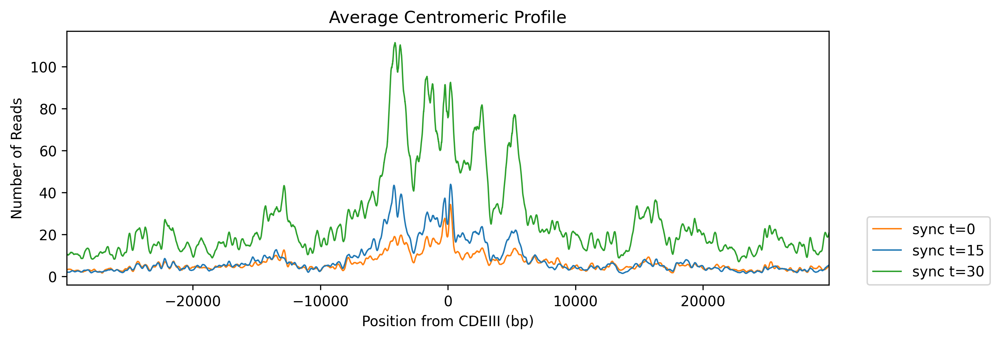

In [42]:
if cen_plot:
    plot_data(
        data=CEN_sample_avgs,
        start=cen_filter_size_left,
        end=cen_filter_size_right,
        window_len=cen_window_len,
        xlabel='Position from CDEIII (bp)',
        title=f'Average Centromeric Profile',
        save_name='all_sample_CDEIII',
        include_num=False,
        xsize=7.5,
        ysize=2.5,
    )

#### Each sample plotted on a separate plot 

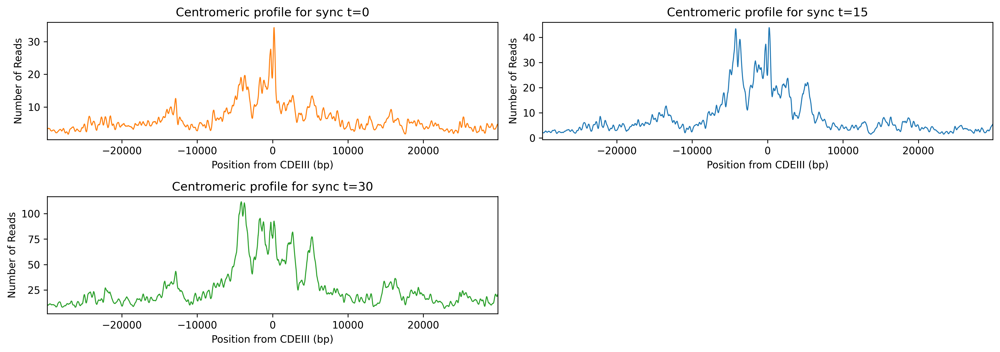

In [43]:
if cen_plot_each_sample and len(set(sample_names)) > 1:
    nrows = math.ceil(len(CEN_sample_avgs)**0.5)
    fig, axes = plt.subplots(nrows, nrows, figsize=(nrows*7, nrows*2.5), dpi=300);
    list_idx = iter([num for num in range(nrows**2)])
    
    for sample in CEN_sample_avgs: 
        idx = next(list_idx)
        i = math.floor(idx/nrows)
        n = idx - i * nrows  
        individual_subplots(
            i=i, 
            n=n, 
            window_len=cen_window_len,
            results=CEN_sample_avgs[sample],
            start=cen_filter_size_left,
            end=cen_filter_size_right,
            title=(f"Centromeric profile for {sample}"),
            xlabel='Position from CDEIII (bp)',
            colour=sample_colour_dict[sample],
            )
    if len(CEN_sample_avgs) < nrows **2:
        for num in range(nrows**2 - len(CEN_sample_avgs)):
            idx = next(list_idx)
            i = math.floor(idx/nrows)
            n = idx - i * nrows  
            fig.delaxes(axes[i][n])
        
    plt.tight_layout()
    fig.savefig(join(path,'around_CDEIII_each_sample.png'), bbox_inches='tight')


#### Each sample relative to comparator on the same plot

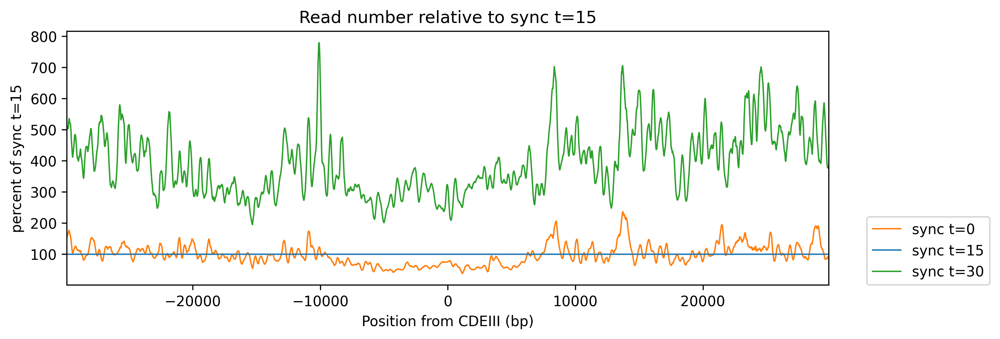

In [44]:
if relative_to_comparator and comparator != '':
    samples_not_comparator = [sample for sample in sample_names if sample!=comparator]
    if len(samples_not_comparator) > 0:
        plot_data(    
            data=CEN_sample_avgs,
            start=cen_filter_size_left,
            end=cen_filter_size_right,
            comparator=comparator,
            relative=True,
            title = f"Read number relative to {comparator}",
            ylabel = f"percent of {comparator}",
            window_len=cen_window_len,
            xlabel='Position from CDEIII (bp)',
            save_name='relative_to_comparator',
            include_num=False,
            xsize=7.5,
            ysize=2.5,
        )

### Plot each chromosome

#### Plot all chromosomes in each sample separately

Analysing Individual Chromosomes


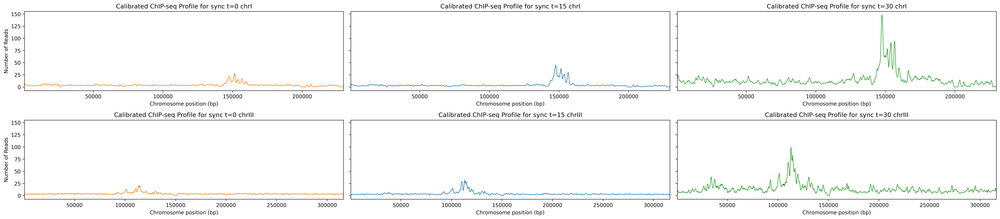

In [45]:
if plot_individual_chr:
    print('Analysing Individual Chromosomes')
    if (len(df_processed_pileups.columns.get_level_values(0).unique()) > 1
        and len(df_processed_pileups.columns.levels[1]) > 1):        
        nrows = len(df_processed_pileups.columns.levels[1])
        ncols = len(df_processed_pileups.columns.get_level_values(0).unique())
    elif (len(df_processed_pileups.columns.get_level_values(0).unique()) == 1
        and len(df_processed_pileups.columns.levels[1]) > 1): 
        nrows = len(df_processed_pileups.columns.levels[1])
        ncols = 2
    elif (len(df_processed_pileups.columns.get_level_values(0).unique()) > 1
        and len(df_processed_pileups.columns.levels[1]) == 1): 
        nrows = 2
        ncols = len(df_processed_pileups.columns.levels[0])
    else:
        nrows = 2 
        ncols = 2
    
    fig,axes = plt.subplots(
        nrows, ncols, 
        figsize=(ncols*9,nrows*3), 
        dpi=300, sharey=True);
    
    chromosomes = list(df_processed_pileups.columns.get_level_values(1).unique())
    chromosomes.sort(key=lambda x: chr_order[x])
    samples = list(df_processed_pileups.columns.get_level_values(0).unique())
    for chromosome in chromosomes:
        i = chromosomes.index(chromosome)
        for sample in df_processed_pileups.xs(chromosome, axis=1, level=1).columns:
            n = samples.index(sample)
            individual_subplots(
                i=i,
                n=n,
                window_len=individual_chr_window_len,
                results=(
                    df_processed_pileups[(sample,chromosome)].
                    loc[0:chr_lens[chromosome]]
                ),
                start=0,
                end=chr_lens[chromosome],
                title=(
                    f'Calibrated ChIP-seq Profile for {sample} {chromosome}'
                    ),
                xlabel='Chromosome position (bp)',
                colour=sample_colour_dict[sample],
                lw=1
                )
            if n != 0: 
                axes[i][n].set_ylabel(None)

        if len(df_processed_pileups.xs(chromosome, axis=1, level=1).columns) < len(samples):
            for sample in samples: 
                if sample not in df_processed_pileups.xs(chromosome, axis=1, level=1).columns:
                    fig.delaxes(axes[i][samples.index(sample)])
    
    if len(df_processed_pileups.columns.levels[1]) == 1:
        #axes[0][1] is deleted above
        fig.delaxes(axes[1][0])
        fig.delaxes(axes[1][1])
    
    if len(df_processed_pileups.columns.levels[0]) == 1: 
        for chromosome in chromosomes:
            fig.delaxes(axes[chromosomes.index(chromosome)][1])

    plt.tight_layout()

    fig.savefig(
        join(path,'individual_chrs_each_sample.png'),
        bbox_inches='tight'
        )

#### Plot all the samples with a given chromosome on the same axes

In [46]:
desired_chrs = list(set([
    chromosome for chromosome in chr_names if 
    len(df_processed_pileups.xs(chromosome, axis=1, level=1).columns) > 1
]))
desired_chrs.sort(key=lambda x: chr_order[x])
#if have only sample per chr, plot will be the same as the individual 
#chromosome plot
#additionally, if have only one sample and that sample is the comparator, 
#then relative plots wont work

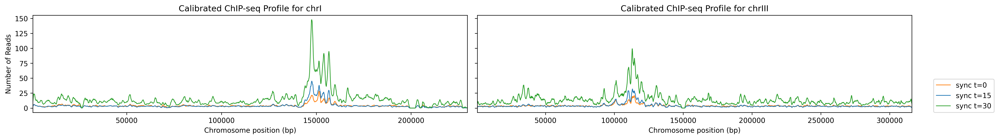

In [47]:
if plot_all_chr_each_sample and len(desired_chrs) > 0:
    if len(desired_chrs) == 1:
        nrows = 2
    else:
        nrows = math.ceil((len(desired_chrs)**0.5))
    fig,axes = plt.subplots(
        nrows, nrows, 
        figsize=(nrows*10,nrows*2.5), 
        dpi=300, sharey=True
    );
    list_idx = iter([num for num in range(nrows**2)])

    for chromosome in desired_chrs:
        idx = next(list_idx)
        i = math.floor(idx/nrows)
        n = idx - i * nrows

        for sample in df_processed_pileups.xs(chromosome, axis=1, level=1).columns:
            individual_subplots(
                i=i,
                n=n,
                results=(
                    df_processed_pileups[(sample, chromosome)].loc[
                        0:chr_lens[chromosome]
                    ]
                    ),
                window_len=individual_chr_window_len,
                start=0,
                end=chr_lens[chromosome],
                label=sample,
                title=f'Calibrated ChIP-seq Profile for {chromosome}',
                xlabel='Chromosome position (bp)',
                colour=sample_colour_dict[sample],
                lw=1
                )
            if idx != len(desired_chrs) - 1:
                axes[i][n].legend().set_visible(False)
            if n != 0: 
                axes[i][n].set_ylabel(None)
    if len(desired_chrs) < nrows**2:
        for num in range((nrows**2 - len(desired_chrs))):  #num empty subplots
            idx = next(list_idx)
            i = math.floor(idx/nrows)
            n = idx - i * nrows
            fig.delaxes(axes[i][n])
    plt.tight_layout()

    fig.savefig(join(path,'individual_chromosome_plots_all_samples'), bbox_inches='tight')

#### For a given chromosome plot chromosome relative to comparator for all samples on the same axes
Note that if different chromosomes are present for different samples, the comparator sample has to have all the chromosomes present in the other samples, otherwise there will be nothing to compare the chromosomes in the other samples to leading to an error. e.g. if sample 1 has chrs I and II and sample 2 has chr III, then comparator has to have at least chrs I, II and III, if it is missing any of these then it is not possible to perform relative plots

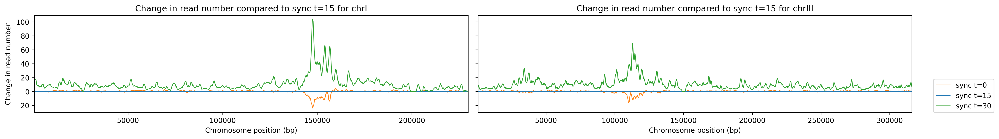

In [48]:
samples_not_comparator = [sample for sample in sample_names if sample != comparator]
if (each_chr_rel_to_comp
    and comparator != ''
    and len(samples_not_comparator) > 0):
    
    if len(desired_chrs) == 1:
        nrows = 2
    else:
        nrows = math.ceil(len(desired_chrs)**0.5)
    fig,axes = plt.subplots(nrows, nrows, figsize=(nrows*10, nrows*2.5), dpi=300, sharey=True);
    list_idx = iter([num for num in range(nrows**2)])

    for chromosome in desired_chrs:
        idx = next(list_idx)
        i = math.floor(idx/nrows)
        n = idx - i * nrows 

        for sample in df_processed_pileups.xs(chromosome, axis=1, level=1).columns:
            rel_vals = (
                (
                    df_processed_pileups[sample][chromosome]
                    -df_processed_pileups[comparator][chromosome]
                ).loc[0:chr_lens[chromosome]]
            )
#expressing as a percent skews data (greater weighting given to very small values which are 
#subject to large relative fluctuations due to random experimental variation)
#difference plot as a percentage also skewed as a 50% decrease is the opposite of a 200% 
#increase and yet a 200% increase contributes much more to a rolling average
            
            individual_subplots(
                i=i,
                n=n,
                results=rel_vals,
                window_len=individual_chr_window_len,
                start=0,
                end=chr_lens[chromosome],
                label=sample,
                title=f"Change in read number compared to {comparator} for {chromosome}",
                xlabel='Chromosome position (bp)',
                colour=sample_colour_dict[sample],
                ylabel=f"Change in read number",
                lw=1
                )  
            if idx != len(desired_chrs) - 1:
                axes[i][n].legend().set_visible(False)
            if n != 0: 
                axes[i][n].set_ylabel(None)
    if len(desired_chrs) < nrows**2:
        for num in range((nrows**2 - len(desired_chrs))):
            idx = next(list_idx)
            i = math.floor(idx/nrows)
            n = idx - i * nrows
            fig.delaxes(axes[i][n])   
    plt.tight_layout()
    fig.savefig(join(path,"all_chr_relative_to_comparator"), bbox_inches='tight')

### Plots around pericentromeric borders

In [49]:
if plot_pericen_borders:  
    print('Analysing Pericentromeric Border Regions')
    df_borders = pd.read_csv("border_vals.csv")
    #border vals from (https://doi.org/10.1038/s41586-020-2244-6)

    border_data = {}
    for chromosome in {chromosome: "" for chromosome in chr_names}:
        border_data[chromosome] = (
            df_borders[df_borders['Chromosome']==chromosome].
            sort_values(by='Start',ignore_index=True)
            )

Analysing Pericentromeric Border Regions


In [50]:
if plot_pericen_borders:
    (border_sliced_df, border_sample_slices, 
     border_sample_avgs) = slice_data(
        df_chr_feature=border_data,
        pileup_df=df_processed_pileups,
        sample_chr=sample_chr,
        sample_names=sample_names,
        start_slice=-border_filter,
        end_slice=border_filter,
        end_col='Start'
        )
    if save_averaged_data:
        border_sample_avgs_df = pd.DataFrame(border_sample_avgs)
        border_sample_avgs_df.to_csv(join(path, "border_sample_avgs.csv"))

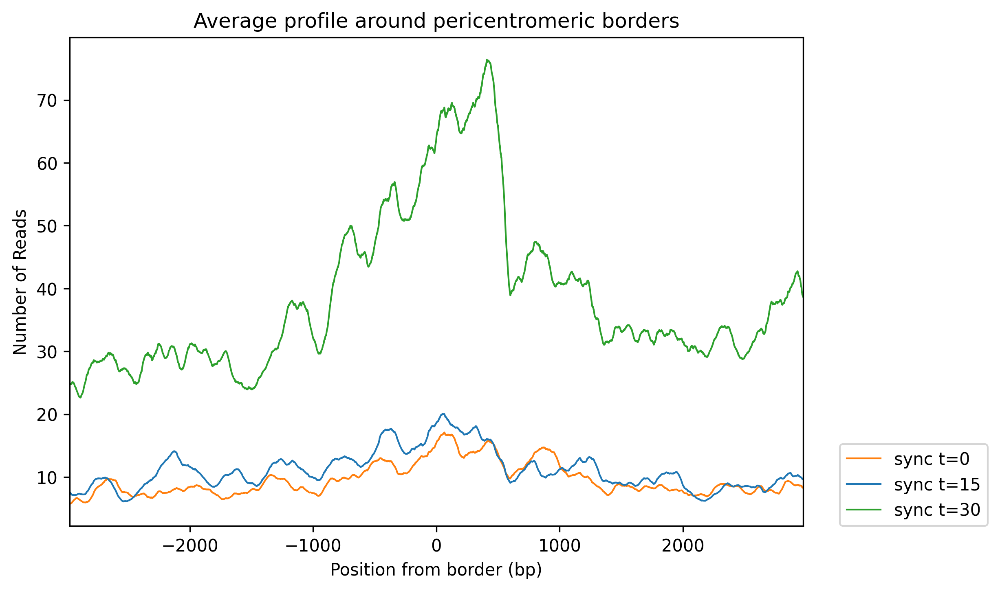

In [51]:
if plot_pericen_borders:  
    plot_data(
        data=border_sample_avgs,
        start=-border_filter,
        end=border_filter,
        xsize=6,
        ysize=4,
        window_len=pericen_window_len,
        xlabel='Position from border (bp)',
        title='Average profile around pericentromeric borders',
        save_name='average_border_slice',
        include_num=False,
        lw=1
    )

### Analyse ChIP-seq data in relation to ARSs 

#### Plot occupancy around ARSs binned by ARS properties

In [52]:
if around_ARSs:
    ARS_info = pd.read_csv("ARS_info.csv", usecols=[0,1,2,3,4,5])

    bins = np.linspace(0, 1, num=ARS_properties_bins+1)
    bins = [round(num, 2) for num in bins]
    groups = ARS_info.groupby(
        np.digitize(ARS_info[ARS_property], bins)
        )

    grouped_by_chrs = {}

    for group in groups:
        ARSs = {}
        for chromosome in {chromosome: "" for chromosome in chr_names}:
            ARSs[chromosome] = (
                group[1][group[1]['Chromosome']==chr_order[chromosome]].
                sort_values(by='Start')
                )
        if ARSs != {}:
            grouped_by_chrs[group[0]] = ARSs

    grouped_chrs = {}
    for a_bin in grouped_by_chrs:
        for chromosome in grouped_by_chrs[a_bin]:
            if not grouped_by_chrs[a_bin][chromosome].empty:
                grouped_chrs[a_bin] = grouped_by_chrs[a_bin]

In [53]:
if around_ARSs:    
    print('Analysing Occupancy Around ARSs')
    bin_around_ARS_sliced_df = {}
    bin_around_ARS_sample_slices = {}
    bin_around_ARS_sample_avgs = {}

    for a_group in grouped_chrs:
        (around_ARS_sliced_df, around_ARS_sample_slices, 
         around_ARS_sample_avgs) = slice_data(
            df_chr_feature=grouped_chrs[a_group],
            pileup_df=df_processed_pileups,
            sample_chr=sample_chr,
            sample_names=sample_names,
            start_slice=around_ARS_start_slice,
            end_slice=around_ARS_end_slice,
            relative=True,
            bins=ARS_bins
            )
        bin_around_ARS_sliced_df[a_group] = around_ARS_sliced_df
        bin_around_ARS_sample_slices[a_group] = around_ARS_sample_slices
        bin_around_ARS_sample_avgs[a_group] = around_ARS_sample_avgs
        
    if save_averaged_data:
        save_bin_around_ARS_sample_avgs = {}
        for a_bin in bin_around_ARS_sample_avgs:
            for sample in bin_around_ARS_sample_avgs[a_bin]: 
                save_bin_around_ARS_sample_avgs[f'{sample}_bin_{a_bin}'] = bin_around_ARS_sample_avgs[a_bin][sample]

        save_bin_around_ARS_sample_avgs = pd.DataFrame(save_bin_around_ARS_sample_avgs)
        save_bin_around_ARS_sample_avgs.to_csv(join(path, "bin_around_ARS_sample_avgs.csv"))
        
    #note, the saved format is different from what is used below, so it isn't possible
    #to just read the data in and re-use it

Analysing Occupancy Around ARSs


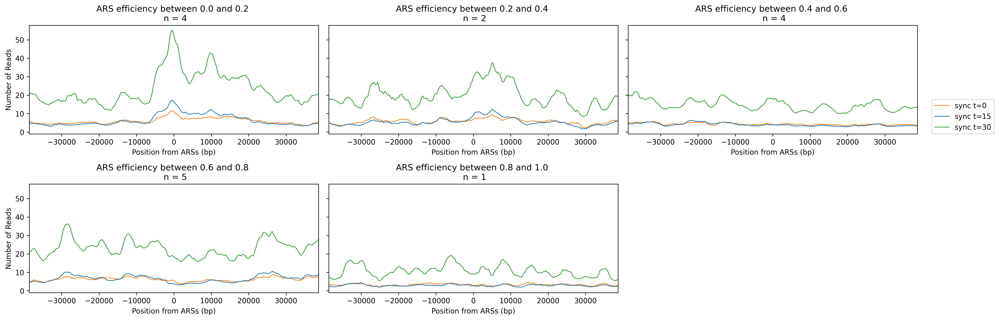

In [54]:
if around_ARSs:
    if len(bin_around_ARS_sample_avgs) == 1:
        nrows = 2
    else: 
        nrows = math.ceil(len(bin_around_ARS_sample_avgs)**0.5)
    fig,axes = plt.subplots(nrows, nrows, figsize=(nrows*6.5, nrows*3), dpi=300, sharey=True);
    list_idx = iter([num for num in range(nrows**2)])
    for a_bin in bin_around_ARS_sample_avgs:
        idx = next(list_idx)
        i = math.floor(idx/nrows)
        n = idx - i * nrows  
        for sample in bin_around_ARS_sample_avgs[a_bin]:
            individual_subplots(
                i=i,
                n=n,
                results=bin_around_ARS_sample_avgs[a_bin][sample],
                window_len=around_ARS_window_len,
                start=around_ARS_start_slice,
                end=around_ARS_end_slice,
                binned=True,
                num_bins=ARS_bins,
                title=f'{ARS_property.replace("Time-course", "ARS")} between {bins[a_bin-1]} and {bins[a_bin]} \n n = {len(bin_around_ARS_sample_slices[a_bin][sample].columns)}',
                xlabel='Position from ARSs (bp)',
                label=f'{sample}',
                colour=sample_colour_dict[sample]
                )
            
            if n != 0: 
                axes[i][n].set_ylabel(None)
            if n != nrows - 1 or i != 0:
                axes[i][n].legend().set_visible(False)
                
    if len(bin_around_ARS_sample_avgs) < nrows**2:
        for num in range(nrows**2 - len(bin_around_ARS_sample_avgs)):
            idx = next(list_idx)
            i = math.floor(idx/nrows)
            n = idx - i * nrows
            fig.delaxes(axes[i][n])
            
    plt.tight_layout()
    fig.savefig(join(path,'around_ARSs.png'),bbox_inches='tight')

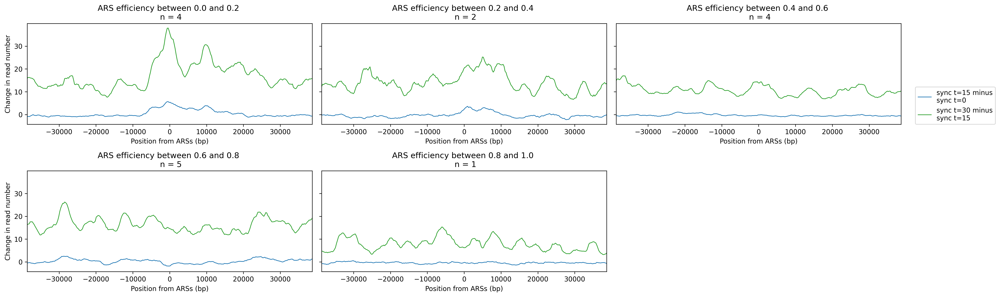

In [55]:
if around_ARSs: 
    around_ARS_diff = {}
    for a_bin in bin_around_ARS_sample_avgs:
        around_ARS_diff[a_bin] = calc_diff(
            bin_around_ARS_sample_avgs[a_bin], 
            around_ARS_diff_pairs,
            around_ARS_diff_percent
        )
    if around_ARS_diff_percent: 
        ylabel = f'Change in occupancy (%)'
    else: 
        ylabel = f'Change in read number'
    if around_ARS_diff != {}:
        if len(bin_around_ARS_sample_avgs) == 1:
            nrows = 2
        else: 
            nrows = math.ceil(len(bin_around_ARS_sample_avgs)**0.5)

        fig,axes = plt.subplots(nrows, nrows, figsize=(nrows*7, nrows*3), dpi=300, sharey=True);
        list_idx = iter([num for num in range(nrows**2)])

        for a_bin in bin_around_ARS_sample_avgs:
            idx = next(list_idx)
            i = math.floor(idx/nrows)
            n = idx - i * nrows  

            for difference in around_ARS_diff[a_bin]:
                if around_ARS_diff[a_bin] != {}:
                    lower = difference.split('_minus_')[1]
                    higher = difference.split('_minus_')[0]
                    individual_subplots(
                        i=i,
                        n=n,
                        results=around_ARS_diff[a_bin][f'{higher}_minus_{lower}'],
                        window_len=around_ARS_window_len,
                        start=around_ARS_start_slice,
                        end=around_ARS_end_slice,
                        binned=True,
                        num_bins=ARS_bins,
                        title=f'{ARS_property.replace("Time-course", "ARS")} between {bins[a_bin-1]} and {bins[a_bin]} \n n = {len(bin_around_ARS_sample_slices[a_bin][sample].columns)}',
                        xlabel='Position from ARSs (bp)',
                        label=f"{higher} minus\n{lower}",  
                        colour=sample_colour_dict[higher],
                        ylabel=ylabel
                    )

                    if n != 0: 
                        axes[i][n].set_ylabel(None)
                    
                    if n != nrows - 1:
                        axes[i][n].legend().set_visible(False)
                        
            if around_ARS_diff[a_bin] == {}:
                fig.delaxes(axes[i][n])

        if len(bin_around_ARS_sample_avgs) < nrows**2:
            for num in range(nrows**2 - len(bin_around_ARS_sample_avgs)):
                idx = next(list_idx)
                i = math.floor(idx/nrows)
                n = idx - i * nrows
                fig.delaxes(axes[i][n])


        plt.tight_layout()
        fig.savefig(join(path,'diff_plot_around_ARSs.png'),bbox_inches='tight')

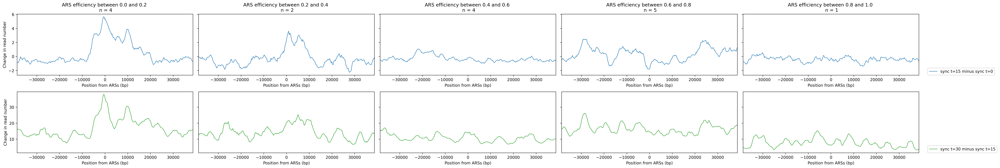

In [56]:
if around_ARSs and len(around_ARS_diff) > 1:
    if around_ARS_diff_pairs == 'sequential' or around_ARS_diff_pairs == 'relative':
        nrows = len(set(sample_names)) - 1
    else:
        nrows = len(around_ARS_diff_pairs)
    del_row = False
    if nrows == 1: 
        nrows = 2
        del_row = True
    
    if ARS_properties_bins == 1:
        ncols = 2
    else: 
        ncols = ARS_properties_bins
    
    if around_ARS_diff_percent: 
        ylabel = f'Change in occupancy (%)'
    else: 
        ylabel = f'Change in read number'
    
    if nrows != 0 and ncols != 0:
        fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*7, nrows*3), dpi=300, sharey='row');
        col_idx = iter([num for num in range(ncols)])

        for a_bin in bin_around_ARS_sample_avgs:
            n = next(col_idx)
            row_idx = iter([num for num in range(nrows)])
            if around_ARS_diff[a_bin] != {}:
                for difference in around_ARS_diff[a_bin]:
                    i = next(row_idx)
                    lower = difference.split('_minus_')[1]
                    higher = difference.split('_minus_')[0]
                    individual_subplots(
                        i=i,
                        n=n,
                        results=around_ARS_diff[a_bin][difference],
                        window_len=around_ARS_window_len,
                        start=around_ARS_start_slice,
                        end=around_ARS_end_slice,
                        binned=True,
                        num_bins=ARS_bins,
                        title=f'{ARS_property.replace("Time-course", "ARS")} between {bins[a_bin-1]} and {bins[a_bin]} \n n = {len(bin_around_ARS_sample_slices[a_bin][sample].columns)}',
                        xlabel='Position from ARSs (bp)',
                        label=f"{higher} minus {lower}",  
                        colour=sample_colour_dict[higher],
                        ylabel=ylabel
                        )
                    
                    if n != 0: 
                        axes[i][n].set_ylabel(None)
                    if n != ncols - 1:
                        axes[i][n].legend().set_visible(False)
                    if i != 0:
                         axes[i][n].set_title(None)
            elif around_ARS_diff[a_bin] == {}:
                i = next(row_idx)
                fig.delaxes(axes[i][n])
        if len(bin_around_ARS_sample_avgs) < ncols: 
            for num in range(ncols - len(bin_around_ARS_sample_avgs)):
                n = next(col_idx)
                fig.delaxes(axes[i][n])
        if del_row:
            for num in range(ncols):
                fig.delaxes(axes[1][num])
        plt.tight_layout()
        fig.savefig(join(path,'diff_plot_around_ARSs_each_sample.png'),bbox_inches='tight')

#### Overlay DNA content changes onto changes in cohesin read number for around ARSs 

In [57]:
if overlaid_ARS_data:
    with open(IP_data, 'rb') as f:  #could make the dictionary name an argument specified at the top
        ARS_avgs_IP = pickle.load(f)
    with open(DNA_data, 'rb') as f:  
        ARS_avgs_DNA = pickle.load(f)

In [58]:
if overlaid_ARS_data: 
    ARS_diff_IP = {}
    for a_bin in ARS_avgs_IP:
        ARS_diff_IP[a_bin] = calc_diff(
            ARS_avgs_IP[a_bin], 
            around_ARS_diff_pairs,
            around_ARS_diff_percent
        )
    ARS_diff_DNA = {}
    for a_bin in ARS_avgs_DNA:
        ARS_diff_DNA[a_bin] = calc_diff(
            ARS_avgs_DNA[a_bin], 
            around_ARS_diff_pairs,
            around_ARS_diff_percent
        )

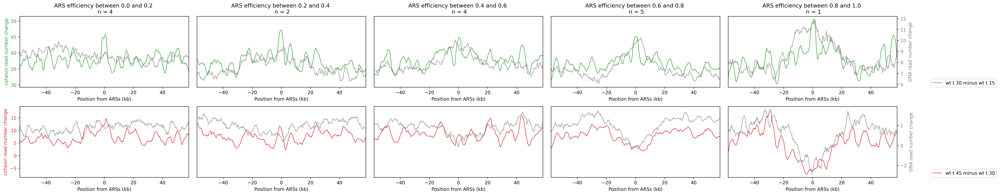

In [59]:
if overlaid_ARS_data: 
    fig, axes = plt.subplots(ARS_overlaid_nrows, ARS_overlaid_ncols, figsize=(ARS_overlaid_ncols*6, ARS_overlaid_nrows*3), dpi=300, sharey='row');
    col_idx = iter([num for num in range(ARS_overlaid_ncols)])
    ylim_max = {}
    ylim_min = {}
    for difference in ARS_diff_DNA[1]:
        ylim_max[difference] = 0
        ylim_min[difference] = 0
    for a_bin in ARS_diff_DNA:
        for difference in ARS_diff_DNA[a_bin]:
            if ylim_max[difference] == 0:
                ylim_max[difference] = ARS_diff_DNA[a_bin][difference].rolling(10, center=True).mean().max()
            elif ARS_diff_DNA[a_bin][difference].rolling(10, center=True).mean().max() > ylim_max[difference]:
                ylim_max[difference] = ARS_diff_DNA[a_bin][difference].rolling(10, center=True).mean().max()

    for a_bin in ARS_diff_DNA:
        for difference in ARS_diff_DNA[a_bin]:
            if ylim_min[difference] == 0:
                ylim_min[difference] = ARS_diff_DNA[a_bin][difference].rolling(10, center=True).mean().min()
            elif ARS_diff_DNA[a_bin][difference].rolling(10, center=True).mean().min() < ylim_min[difference]:
                ylim_min[difference] = ARS_diff_DNA[a_bin][difference].rolling(10, center=True).mean().min()

    for difference in ylim_max: 
        ylim_max[difference] = ylim_max[difference] + (5*(ylim_max[difference]-ylim_min[difference])/100)
        ylim_min[difference] = ylim_min[difference] - (5*(ylim_max[difference]-ylim_min[difference])/100)
        # add 5% padding to make plot less tight

    for a_bin in ARS_diff_IP:
        n = next(col_idx)
        row_idx = iter([num for num in range(ARS_overlaid_nrows)])
        if ARS_diff_IP[a_bin] != {}:
            #for num in range(len(ARS_diff_IP[a_bin])):
            for num in [1,2]:
                i = next(row_idx)
                lower = list(ARS_diff_DNA[a_bin])[num].split('_minus_')[1]
                higher = list(ARS_diff_DNA[a_bin])[num].split('_minus_')[0]
                results=ARS_diff_IP[a_bin][list(ARS_diff_IP[a_bin])[num]]
                window_len=13
                start=ARS_overlaid_start  #pass as parameters above
                end=ARS_overlaid_end
                binned=ARS_overlaid_binned
                num_bins=ARS_bins
                title=f'{ARS_property.replace("Time-course", "ARS")} between {bins[a_bin-1]} and {bins[a_bin]} \n n = {len(bin_around_ARS_sample_slices[a_bin][sample].columns)}'
                xlabel='Position from ARSs (kb)'
                label=f"{higher} minus {lower}"  
                ylabel=f'{IP_target} read number change'
                loc=[1.2, 0]
                if num == 1:
                    color = 'tab:green'
                else: 
                    color = 'tab:red'

                if label != False:
                    label = label.replace('_IP', '').replace('_', ' ')
                if title:
                    title = title.replace('_IP', '').replace('_', ' ')
                if binned:
                    index = np.linspace(start, end, num=len(ARS_diff_IP[a_bin][list(ARS_diff_IP[a_bin])[num]]))
                else:
                    index = np.arange(start, end+1)

                axes[i][n].plot(
                    index, 
                    results.rolling(
                        window_len, center=True,
                        min_periods=int(window_len/2)
                        ).mean(), 
                    linewidth=1, 
                    label=label, 
                    color=color
                )

                if binned: 
                    x_lower = start + int(((end - start)/num_bins)*(window_len/2))
                    x_upper = end - int(((end - start)/num_bins)*(window_len/2))
                else:
                    x_lower = start + int(window_len/2)
                    x_upper = end - int(window_len/2)
                axes[i][n].set_xlim(x_lower, x_upper)
                axes[i][n].set_xlabel(xlabel)
                axes[i][n].set_ylabel(ylabel, color=color)
                axes[i][n].set_title(title)
                axes[i][n].tick_params(axis='y', labelcolor=color)
                axes[i][n].legend(loc=loc)

                if n != 0: 
                    axes[i][n].set_ylabel(None)
                    axes[i][n].get_yaxis().set_visible(False)
                if n != ARS_overlaid_ncols - 1:
                    axes[i][n].legend().set_visible(False)
                if i != 0:
                     axes[i][n].set_title(None)

                ax1 = axes[i][n].twinx()         
                color = 'tab:gray'
                ax1.set_ylabel('DNA read number change', color=color)  # we already handled the x-label with ax1
                ax1.plot(index, ARS_diff_DNA[a_bin][list(ARS_diff_DNA[a_bin])[num]].rolling(window=10, center=True).mean(), color=color, alpha=0.6)
                ax1.tick_params(axis='y', labelcolor=color)
                ax1.set_ylim(ylim_min[list(ARS_diff_DNA[a_bin])[num]],ylim_max[list(ARS_diff_DNA[a_bin])[num]]) 
                if n != ARS_overlaid_ncols - 1:
                    ax1.set_ylabel(None)
                    ax1.get_yaxis().set_visible(False)
                    #ax1.set_yticklabels([])

        elif around_ARS_diff[a_bin] == {}:
            i = next(row_idx)
            fig.delaxes(axes[i][n])
    if len(bin_around_ARS_sample_avgs) < ARS_overlaid_ncols: 
        for num in range(ARS_overlaid_ncols - len(bin_around_ARS_sample_avgs)):
            n = next(col_idx)
            fig.delaxes(axes[i][n])
    if del_row:
        for num in range(ARS_overlaid_ncols):
            fig.delaxes(axes[1][num])
    plt.tight_layout()
    fig.savefig(join(path,'diff_plot_around_ARSs_each_sample.png'),bbox_inches='tight')

#### Analyse around ARSs matching specific criteria (no binning)

In [60]:
if around_ARS_criteria:    
    ARS_info = pd.read_csv("ARS_info.csv", usecols=[0,1,2,3,4,5])
    ARS_info = ARS_info[
        (ARS_info['Time-course efficiency']>ARS_efficiency_lower)
        & (ARS_info['Time-course efficiency']<ARS_efficiency_upper)
        & (ARS_info['T1/2']>ARS_firing_time_lower)
        & (ARS_info['T1/2']<ARS_firing_time_upper)
        & (ARS_info['p']>ARS_competency_lower)
        & (ARS_info['p']<ARS_competency_upper)
        & (ARS_info['Tw']>ARS_activation_distribution_lower)
        & (ARS_info['Tw']<ARS_activation_distribution_upper)
        ].reset_index(drop=True)
    chr_ARS = {}
    for chromosome in {chromosome: "" for chromosome in chr_names}:
        chr_ARS[chromosome] = (
            ARS_info[ARS_info['Chromosome']==chr_order[chromosome]].
            sort_values(by='Start',ignore_index=True)
            )

In [61]:
if around_ARS_criteria:     
    (ARS_criteria_sliced_df, ARS_criteria_sample_slices, 
     ARS_criteria_sample_avgs) = slice_data(
        df_chr_feature=chr_ARS,
        pileup_df=df_processed_pileups,
        sample_chr=sample_chr,
        sample_names=sample_names,
        start_slice=ARS_criteria_start_slice,
        end_slice=ARS_criteria_end_slice,
        relative=True,
        bins=ARS_criteria_bins
        )
    if save_averaged_data:
        ARS_criteria_sample_avgs_df = pd.DataFrame(ARS_criteria_sample_avgs)
        ARS_criteria_sample_avgs_df.to_csv(
            join(path, "ARS_criteria_sample_avgs.csv")
        )

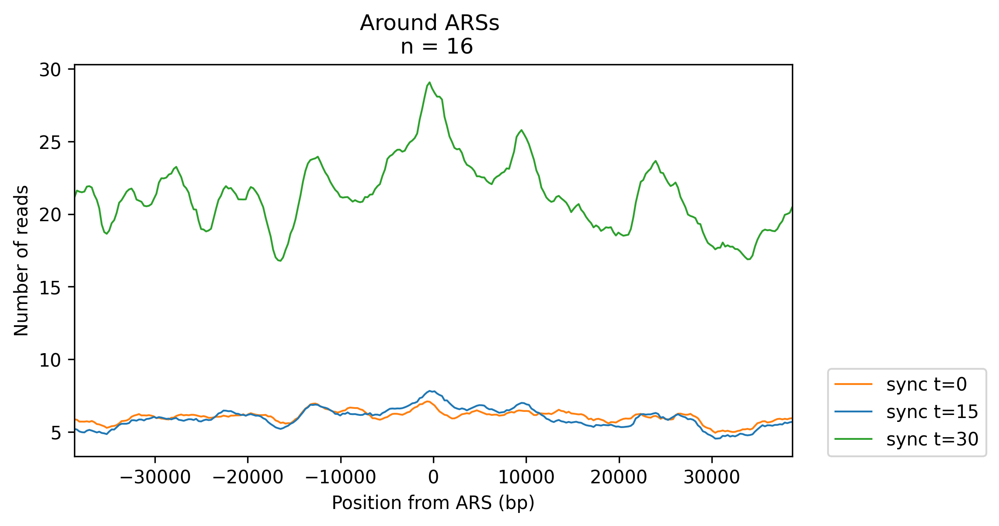

In [62]:
if around_ARS_criteria and ARS_criteria_sample_avgs != {}:
    plot_data(
        data=ARS_criteria_sample_avgs,
        start=ARS_criteria_start_slice,
        end=ARS_criteria_end_slice,
        window_len=ARS_criteria_window_len,  #set above
        binned=True,
        num_bins=ARS_criteria_bins,
        xsize=5.5,
        ysize=3,
        xlabel='Position from ARS (bp)',
        title='Around ARSs',
        ylabel='Number of reads',
        save_name='around_ars_criteria',
        sample_slices=ARS_criteria_sample_slices
    )

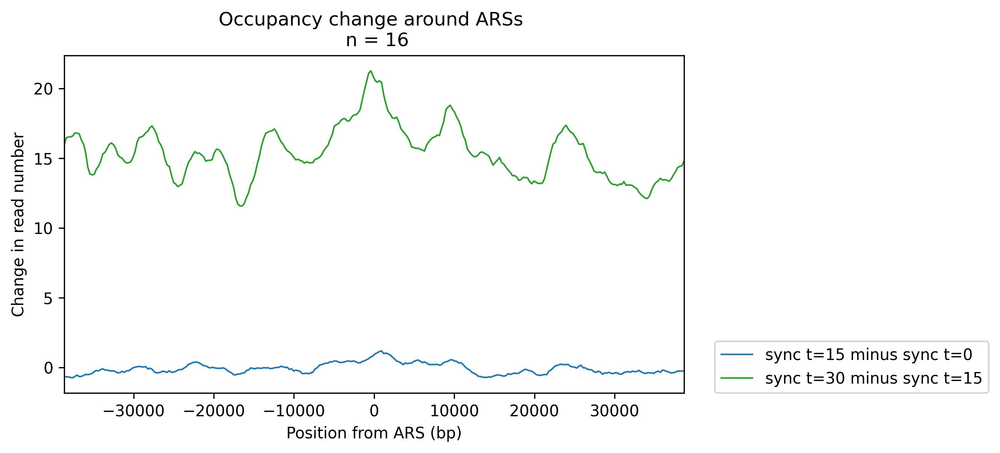

In [63]:
if around_ARS_criteria and ARS_criteria_sample_avgs != {}:
    ARS_criteria_diff = calc_diff(
        data=ARS_criteria_sample_avgs, 
        diff_pairs=ARS_criteria_diff_pairs,
        diff_percent=ARS_criteria_diff_percent
    )
    if ARS_criteria_diff_percent: 
        ylabel = f'Change in occupancy (%)'
    else: 
        ylabel = f'Change in read number'
    if ARS_criteria_diff != {}:
        plot_data(
            data=ARS_criteria_diff,
            start=ARS_criteria_start_slice,
            end=ARS_criteria_end_slice,
            binned=True,
            difference=True,
            num_bins=ARS_criteria_bins,
            xsize=5.5,
            ysize=3,
            window_len=ARS_criteria_window_len,
            xlabel='Position from ARS (bp)',
            title=f'Occupancy change around ARSs',
            ylabel=ylabel,
            save_name='change_in_distribution_around_ARSs_criteria',
            sample_slices=ARS_criteria_sample_slices
        )

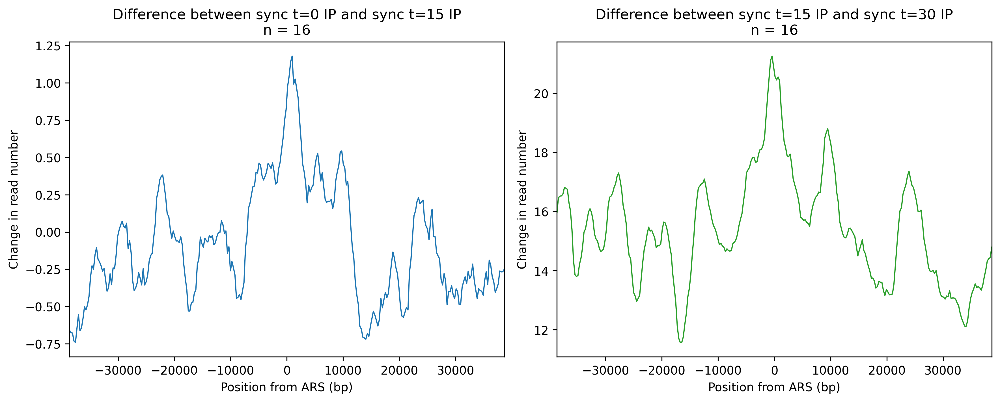

In [64]:
if around_ARS_criteria and ARS_criteria_diff != {} and len(ARS_criteria_diff) > 1:    
    if len(ARS_criteria_diff) == 1:
        nrows = 2
    else:
        nrows = math.ceil((len(ARS_criteria_diff)**0.5))
    list_idx = iter([i for i in range(nrows**2)])
    fig,axes = plt.subplots(nrows, nrows, figsize=(nrows*6,nrows*4.5), dpi=300);
    for difference in ARS_criteria_diff:
        idx = next(list_idx)
        i = math.floor(idx/nrows)
        n = idx - i * nrows
        lower = difference.split('_minus_')[1].replace("_", " ")
        higher = difference.split('_minus_')[0].replace("_", " ")
        individual_subplots(
            i=i,
            n=n,
            results=ARS_criteria_diff[difference],
            window_len=ARS_criteria_window_len,
            start=ARS_criteria_start_slice,
            end=ARS_criteria_end_slice,
            binned=True,
            num_bins=ARS_criteria_bins,
            title=(f"Difference between {lower} and {higher}\nn = {len(ARS_criteria_sample_slices[sample].columns)}"),
            xlabel='Position from ARS (bp)',
            colour=sample_colour_dict[difference.split('_minus_')[0]],
            ylabel=ylabel
            )
    plt.tight_layout()

    if len(ARS_criteria_diff) < nrows**2:
        for num in range(nrows**2 - len(ARS_criteria_diff)):
            idx = next(list_idx)
            i = math.floor(idx/nrows)
            n = idx - i * nrows
            fig.delaxes(axes[i][n])

    fig.savefig(
        join(path,'around_ARS_critieria_change_each_sample.png'),
        bbox_inches='tight'
        )

### Load in data from SGD
The data of S. cerevisiae feautures is from yeastmine (part of SGD) and is loaded in anew each time from yeastmine meaning the database loaded will always be up to date. However, if this does not work, for example the link breaks, it is possible to load in a snapshot of the SGD data stored in a local csv file ("df_SGD=pd.read_csv("SGD_Chr_Features_Tab.csv")").

In [65]:
if (align_on_ORF_5_prime or align_on_ORF_3_prime or plot_ORFs 
    or plot_convergent_genes or plot_div_genes or plot_tRNA_genes):  
    service = Service("https://yeastmine.yeastgenome.org/yeastmine/service")
    query = service.new_query("SequenceFeature")
    query.add_view(
        "featureType", "qualifier", "secondaryIdentifier",
        "chromosome.primaryIdentifier", "chromosomeLocation.start",
        "chromosomeLocation.end", "chromosomeLocation.strand"
    )
    query.add_sort_order("SequenceFeature.chromosomeLocation.start", "ASC")
    query.add_constraint("featureType", "IS NOT NULL", code="B")
    query.add_constraint("featureType", "!=", "chromosome", code="C")
    query.add_constraint("featureType", "!=", "not in systematic sequence of S288C", code="D")
    query.add_constraint("status", "=", "Active", code="E")

    SGD_data = []
    for row in query.rows():
        SGD_data.append([row["featureType"], row["qualifier"],row["secondaryIdentifier"],
            row["chromosome.primaryIdentifier"], row["chromosomeLocation.start"],
            row["chromosomeLocation.end"],  row["chromosomeLocation.strand"]])
    columns = ['Type', 'Qualifier', 'Systematic_Name', 'Chromosome', 'Start', 'End', 'Strand']

    SGD_dict = {}
    for i in range(len(columns)):
        SGD_dict[columns[i]] = pd.Series([SGD_data[n][i] for n in range(len(SGD_data))])
    SGD_df = pd.concat([SGD_dict[key] for key in SGD_dict], axis=1)
    SGD_df.columns = columns
    SGD_df.sort_values(by = ['Chromosome'], key=lambda x: x.map(chr_order), inplace=True)
    #SGD_df = pd.read_csv("SGD_Chr_Features_Tab.csv") #if offline or link doesn't work

### Grab ORF data

In [66]:
if (align_on_ORF_5_prime or align_on_ORF_3_prime or plot_ORFs 
    or plot_convergent_genes or plot_div_genes or plot_tRNA_genes):   
    ORF_df=SGD_df[(SGD_df['Type']=='ORF') & (SGD_df['Qualifier']=='Verified') & 
                   (SGD_df['Chromosome']!='') & (SGD_df['Chromosome']!='chrmt')]

    ORF_data = {}
    for chromosome in {chromosome: "" for chromosome in chr_names}:
        ORF_data[chromosome] = (
            ORF_df[ORF_df['Chromosome'] == chromosome].
            sort_values(by='Start', ignore_index=True)
            )

### Non-convergent ORFs

In [67]:
plot_ORFs = True

In [68]:
if (align_on_ORF_5_prime or align_on_ORF_3_prime or plot_ORFs):
    non_convergent_genes = {}
    for chromosome in ORF_data:
        chr_non_convergent_genes = pd.DataFrame()
        chr_ORF_data = ORF_data[chromosome]
        for i in range(1, len(chr_ORF_data)-1):
            if not (
                (
                    chr_ORF_data['Strand'].iloc[i] == '1' 
                    and chr_ORF_data['Strand'].iloc[i+1] == '-1' 
                    and chr_ORF_data['End'].iloc[i] < chr_ORF_data['Start'].iloc[i+1]
                ) or 
                (
                    chr_ORF_data['Strand'].iloc[i] == '-1' 
                    and chr_ORF_data['Strand'].iloc[i-1] == '1' 
                    and chr_ORF_data['Start'].iloc[i] > chr_ORF_data['End'].iloc[i-1]
                )
            ):
                chr_non_convergent_genes = chr_non_convergent_genes.append(
                    [chr_ORF_data.iloc[i]]
                )
        non_convergent_genes[chromosome] = chr_non_convergent_genes
    non_convergent_genes_df = pd.concat([non_convergent_genes[chromosome] for chromosome in non_convergent_genes], axis=0)

In [69]:
if plot_ORFs:
    print("Analysing Occupancy Across non-convergent ORFs")
    (non_convergent_gene_sliced_df, non_convergent_gene_sample_slices, 
     non_convergent_gene_sample_avgs) = slice_data(
        df_chr_feature=non_convergent_genes,
        pileup_df=df_processed_pileups,
        sample_chr=sample_chr,
        sample_names=sample_names,
        relative=True,
        whole_slice=True,
        bins=ORF_bins,
        include_len=True,
    )

Analysing Occupancy Across non-convergent ORFs


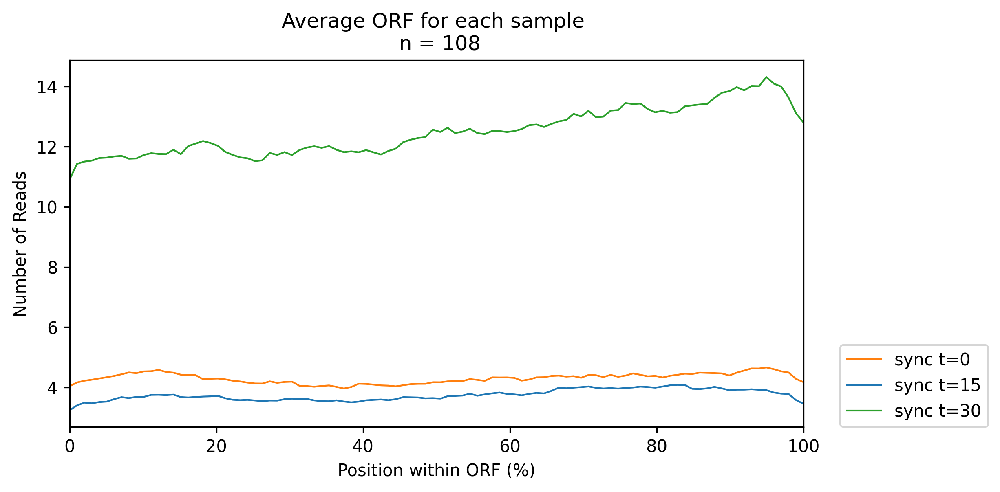

In [70]:
#non convergent genes
if plot_ORFs:
    plot_data(
    data=non_convergent_gene_sample_avgs,
    start=0,
    end=100,
    binned=True,
    num_bins=ORF_bins,
    window_len=ORF_window_len,
    title='Average ORF for each sample',
    xlabel='Position within ORF (%)',
    save_name='average_non_convergent_orf', 
    sample_slices=non_convergent_gene_sample_slices,
    xsize=6,
    ysize=3
)

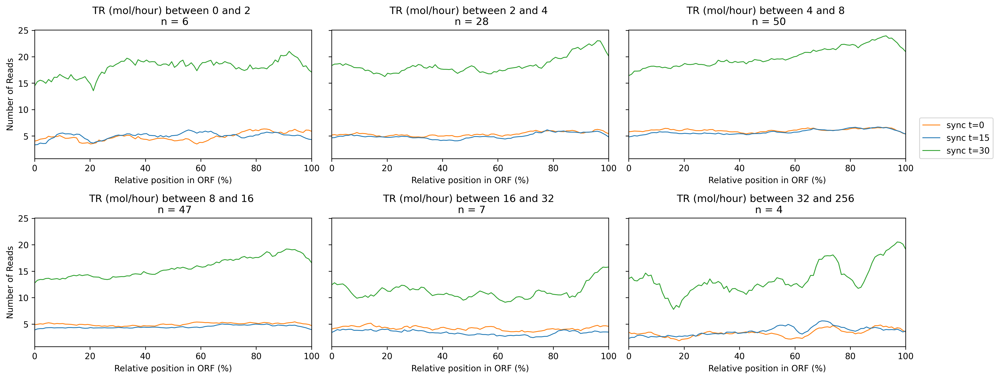

In [71]:
if plot_ORFs:    
    ORF_property = 'TR (mol/hour)'
    transcription_rates = pd.read_csv('transcription_rates.csv')
    transcription_rates.index=transcription_rates['Systematic name']
    if TR_non_conv:
        non_convergent_genes_df.index=non_convergent_genes_df['Systematic_Name']
        ORF_TR = pd.concat([non_convergent_genes_df, transcription_rates],axis=1)
    else: 
        ORF_df.index=ORF_df['Systematic_Name']
        ORF_TR = pd.concat([ORF_df, transcription_rates],axis=1)
    ORF_TR = ORF_TR[ORF_TR['Start'].notna()].reset_index(drop=True)
    ORF_TR = ORF_TR[ORF_TR[ORF_property].notna()].reset_index(drop=True)
    groups = ORF_TR.groupby(
        np.digitize(ORF_TR[ORF_property], TR_ORF_bins)
        )

    grouped_by_chrs = {}
    for group in groups:
        ORFs = {}
        for chromosome in {chromosome: "" for chromosome in chr_names}:
            ORFs[chromosome] = (
                group[1][group[1]['Chromosome']==chromosome].
                sort_values(by='Start')
            )
        if ORFs != {}:
            grouped_by_chrs[group[0]] = ORFs

    grouped_chrs = {}
    for a_bin in grouped_by_chrs:
        for chromosome in grouped_by_chrs[a_bin]:
            if not grouped_by_chrs[a_bin][chromosome].empty:
                grouped_chrs[a_bin] = grouped_by_chrs[a_bin]


    bin_ORF_sliced_df = {}
    bin_ORF_sample_slices = {}
    bin_ORF_sample_avgs = {}

    for a_group in grouped_chrs:
        (ORF_sliced_df, ORF_sample_slices, 
         ORF_sample_avgs) = slice_data(
            df_chr_feature=grouped_chrs[a_group],
            pileup_df=df_processed_pileups,
            sample_chr=sample_chr,
            sample_names=sample_names,
            relative=True,
            whole_slice=True,
            bins=ORF_bins,
            include_len=True,
            )
        bin_ORF_sliced_df[a_group] = ORF_sliced_df
        bin_ORF_sample_slices[a_group] = ORF_sample_slices
        bin_ORF_sample_avgs[a_group] = ORF_sample_avgs

    if save_averaged_data:
        save_bin_ORF_sample_avgs = {}
        for a_bin in bin_ORF_sample_avgs:
            for sample in bin_ORF_sample_avgs[a_bin]: 
                save_bin_ORF_sample_avgs[f'{sample}_bin_{a_bin}'] = bin_ORF_sample_avgs[a_bin][sample]

        save_bin_ORF_sample_avgs = pd.DataFrame(save_bin_ORF_sample_avgs)
        save_bin_ORF_sample_avgs.to_csv(join(path, "bin_ORF_sample_avgs.csv"))

    if len(bin_ORF_sample_avgs) == 1:
        nrows = 2
    else: 
        nrows = math.ceil(len(bin_ORF_sample_avgs)**0.5)
    fig,axes = plt.subplots(nrows, nrows, figsize=(nrows*5.5, nrows*3), dpi=300, sharey=True);
    list_idx = iter([num for num in range(nrows**2)])
    for a_bin in bin_ORF_sample_avgs:
        lower_val = TR_ORF_bins[a_bin-1]
        upper_val = TR_ORF_bins[a_bin]
        idx = next(list_idx)
        i = math.floor(idx/nrows)
        n = idx - i * nrows  
        for sample in bin_ORF_sample_avgs[a_bin]:
            individual_subplots(
                i=i,
                n=n,
                results=bin_ORF_sample_avgs[a_bin][sample],
                window_len=ORF_window_len,
                start=0,
                end=100,
                binned=True,
                num_bins=ORF_bins,
                title=f'{ORF_property} between {lower_val} and {upper_val} \n n = {len(bin_ORF_sample_slices[a_bin][sample].columns)}',
                xlabel='Relative position in ORF (%)',
                label=f'{sample}',
                colour=sample_colour_dict[sample]
                )

        if n != nrows - 1 or i > 0:
            axes[i][n].legend().set_visible(False)
        if n != 0: 
            axes[i][n].set_ylabel(None)
            
    if len(bin_ORF_sample_avgs) < nrows**2:
        for num in range(nrows**2 - len(bin_ORF_sample_avgs)):
            idx = next(list_idx)
            i = math.floor(idx/nrows)
            n = idx - i * nrows
            fig.delaxes(axes[i][n])

    plt.tight_layout()
    fig.savefig(join(path,'TR_ORFs.png'),bbox_inches='tight')

### All ORFs

In [72]:
if plot_ORFs:
    print("Analysing Occupancy Across all ORFs")
    (ORF_sliced_df, ORF_sample_slices, 
     ORF_sample_avgs) = slice_data(
        df_chr_feature=ORF_data,
        pileup_df=df_processed_pileups,
        sample_chr=sample_chr,
        sample_names=sample_names,
        relative=True,
        whole_slice=True,
        bins=ORF_bins,
        include_len=True,
        )
    if save_averaged_data:
        ORF_sample_avgs_df = pd.DataFrame(ORF_sample_avgs)
        ORF_sample_avgs_df.to_csv(join("ORF_sample_avgs.csv", path))


Analysing Occupancy Across all ORFs


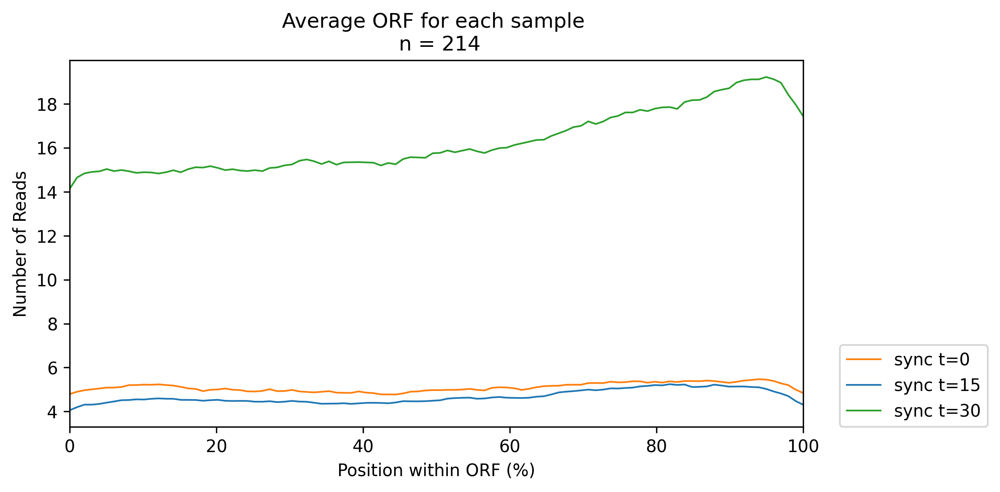

In [73]:
if plot_ORFs:
    plot_data(
    data=ORF_sample_avgs,
    start=0,
    end=100,
    binned=True,
    num_bins=ORF_bins,
    window_len=ORF_window_len,
    title='Average ORF for each sample',
    xlabel='Position within ORF (%)',
    save_name='average_orf', 
    sample_slices=ORF_sample_slices,
    xsize=6,
    ysize=3
)

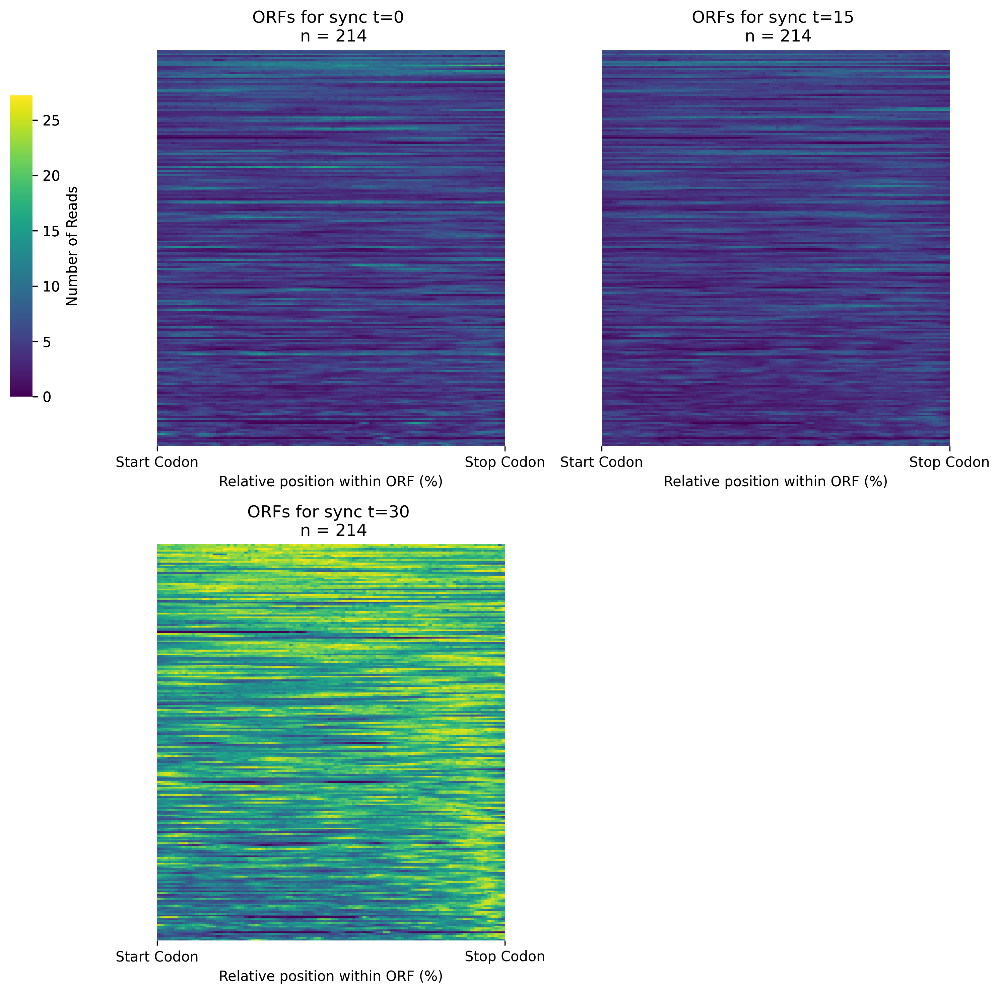

In [74]:
if plot_ORFs:    
    for sample in ORF_sample_slices:
        ORF_sample_slices[sample] = (
            ORF_sample_slices[sample].sort_index(axis=1, level=2)
        )

    max_colorbar = 0
    for sample in ORF_sample_slices:
        if ORF_sample_slices[sample].max().max() > max_colorbar:
            max_colorbar = ORF_sample_slices[sample].max().max()
    
    heatmap_all_slices(
        data=ORF_sample_slices, 
        title=f"ORFs",
        save_name="all_ORF_slices",
        min_colorbar=0,
        max_colorbar=max_colorbar,
        xticks=[0, ORF_bins],
        xticklabels=['Start Codon', 'Stop Codon'],
        xlabel='Relative position within ORF (%)',
        figsize_x=4.5,
        figsize_y=5
    )

### Plot the 5' region of ORFs
Split into convergenet and divergent genes?
Only for ORFs greater than a certain length?

In [75]:
if align_on_ORF_5_prime:
    print("Analysing Occupancy at the ORF 5'")
    if analyse_non_convergent_5_prime: 
        df_chr_feature = non_convergent_genes
    else: 
        df_chr_feature = ORF_data
    (ORF_5_prime_sliced_df, ORF_5_prime_sample_slices, 
     ORF_5_prime_sample_avgs) = slice_data(
        df_chr_feature=df_chr_feature,
        pileup_df=df_processed_pileups,
        sample_chr=sample_chr,
        sample_names=sample_names,
        size_filtering=True,
        start_slice=ORF_5_prime_start_slice,
        end_slice=ORF_5_prime_end_slice,
        ratio_end_slice=2
        )
    if save_averaged_data:
        ORF_5_prime_sample_avgs_df = pd.DataFrame(ORF_5_prime_sample_avgs)
        ORF_5_prime_sample_avgs_df.to_csv(
            join(path, "ORF_5_prime_sample_avgs.csv")
        )

Analysing Occupancy at the ORF 5'


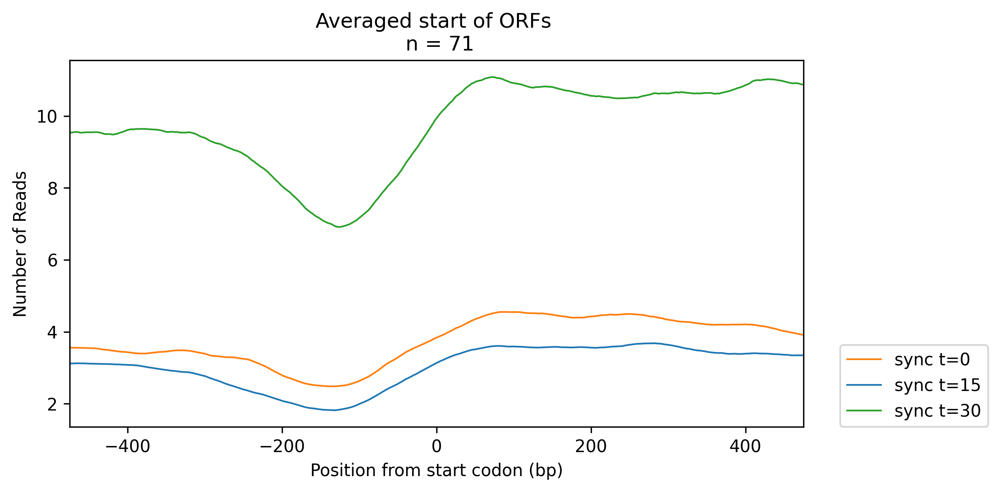

In [76]:
if align_on_ORF_5_prime:    
    plot_data(
        data=ORF_5_prime_sample_avgs,
        start=ORF_5_prime_start_slice,
        end=ORF_5_prime_end_slice,
        window_len=ORF_5_prime_window_len,
        title='Averaged start of ORFs',
        xlabel='Position from start codon (bp)',
        save_name='aligned_on_ORF_5_primes',
        sample_slices=ORF_5_prime_sample_slices,
        xsize=6,
        ysize=3
    )

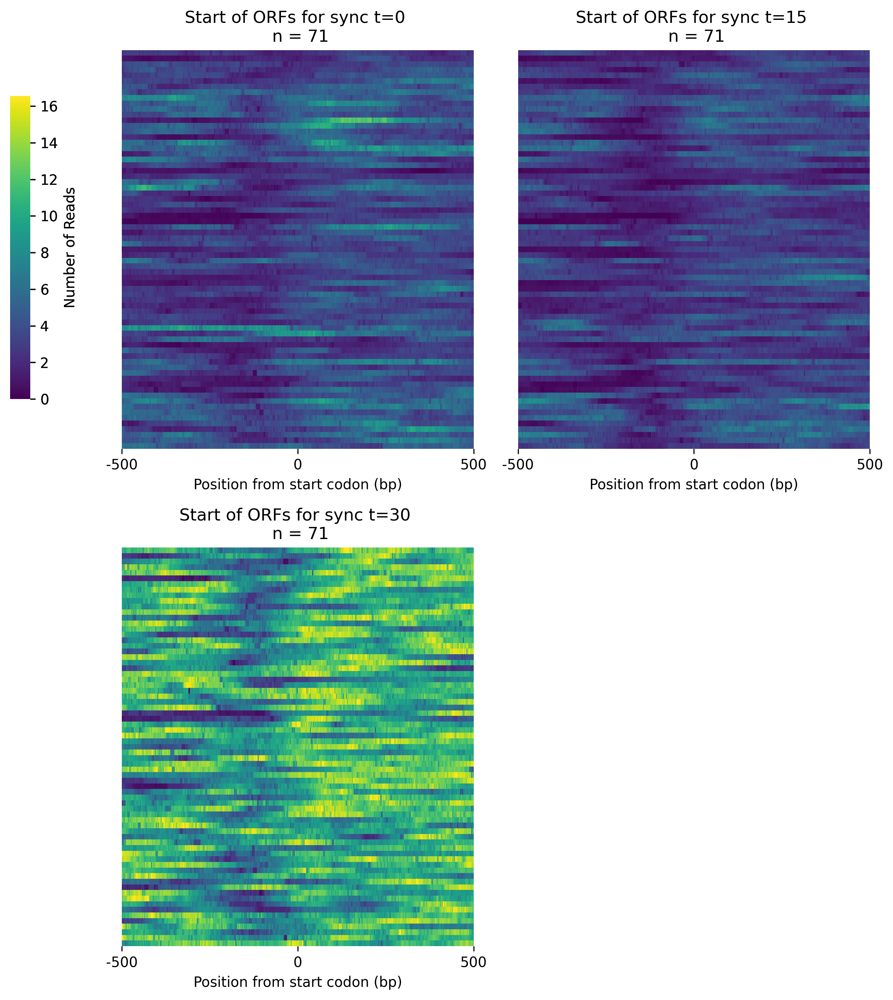

In [77]:
if align_on_ORF_5_prime:    
    max_colorbar = 0
    for sample in ORF_5_prime_sample_slices:
        if ORF_5_prime_sample_slices[sample].max().max() > max_colorbar:
            max_colorbar = ORF_5_prime_sample_slices[sample].max().max()

    heatmap_all_slices(
        data=ORF_5_prime_sample_slices, 
        title=f"Start of ORFs", 
        save_name="all_ORF_5_prime_slices",
        min_colorbar=0,
        max_colorbar=max_colorbar,
        xticklabels=[ORF_5_prime_start_slice, 0, ORF_5_prime_end_slice],
        xlabel='Position from start codon (bp)',
        figsize_x=4,
        figsize_y=5,

        )

### Plot the 3' region of ORFs

In [78]:
if align_on_ORF_3_prime:
    print("Analysing Occupancy at the ORF 3'")
    if analyse_non_convergent_3_prime: 
        df_chr_feature = non_convergent_genes
    else: 
        df_chr_feature = ORF_data
    (ORF_3_prime_sliced_df, ORF_3_prime_sample_slices, 
     ORF_3_prime_sample_avgs) = slice_data(
        df_chr_feature=df_chr_feature,
        pileup_df=df_processed_pileups,
        sample_chr=sample_chr,
        sample_names=sample_names,
        size_filtering=True,
        start_slice=ORF_3_prime_start_slice,
        end_slice=ORF_3_prime_end_slice,
        ratio_end_slice=2,
        start_col='End',
        end_col='Start'
        )
    if save_averaged_data:
        ORF_3_prime_sample_avgs_df = pd.DataFrame(ORF_3_prime_sample_avgs)
        ORF_3_prime_sample_avgs_df.to_csv(
            join(path, "ORF_3_prime_sample_avgs.csv")
        )

Analysing Occupancy at the ORF 3'


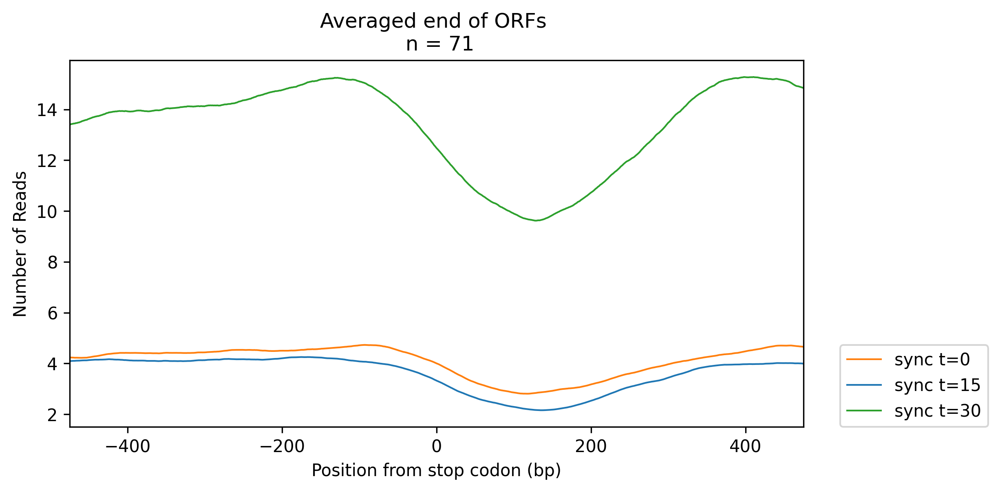

In [79]:
if align_on_ORF_3_prime:    
    plot_data(
        data=ORF_3_prime_sample_avgs,
        start=ORF_3_prime_start_slice,
        end=ORF_3_prime_end_slice,
        window_len=ORF_3_prime_window_len,
        title='Averaged end of ORFs',
        xlabel='Position from stop codon (bp)',
        save_name='aligned_on_ORF_3_primes',
        sample_slices=ORF_3_prime_sample_slices,
        xsize=6,
        ysize=3
    )

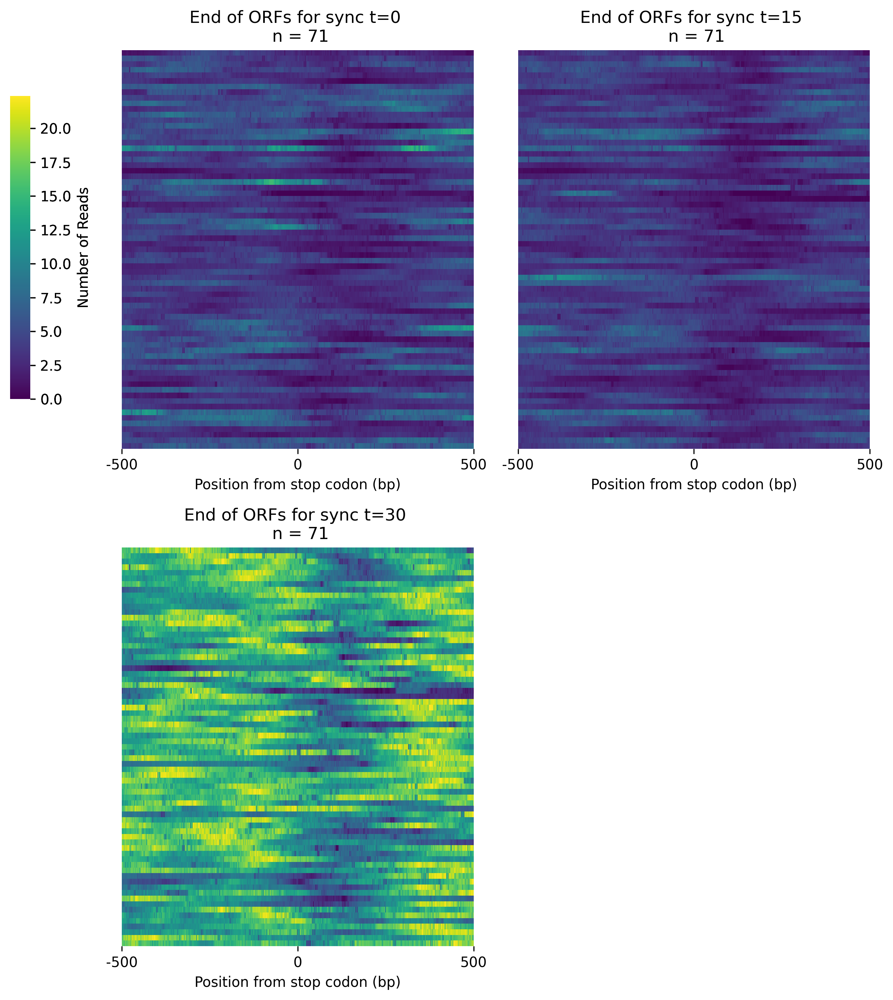

In [80]:
if align_on_ORF_3_prime:
    max_colorbar = 0
    for sample in ORF_3_prime_sample_slices:
        if ORF_3_prime_sample_slices[sample].max().max() > max_colorbar:
            max_colorbar = ORF_3_prime_sample_slices[sample].max().max()

    heatmap_all_slices(
        data=ORF_3_prime_sample_slices, 
        title=f"End of ORFs",
        save_name="all_ORF_3_prime_slices",
        min_colorbar=0,
        max_colorbar=max_colorbar,
        xticklabels=[ORF_3_prime_start_slice, 0, ORF_3_prime_end_slice],
        xlabel='Position from stop codon (bp)',
        figsize_x=4,
        figsize_y=5,
    )

### Around convergent gene pair midpoints

In [81]:
if plot_convergent_genes: 
    print("Analysing Occupancy Across Convergent Genes")
    convergent_genes = {}
    for chromosome in ORF_data:
        chr_convergent_genes = pd.DataFrame()
        chr_ORF_data = ORF_data[chromosome]
        for i in range(len(chr_ORF_data)-1):
            if (chr_ORF_data['Strand'].iloc[i] == '1' 
                and chr_ORF_data['Strand'].iloc[i+1] == '-1' 
                and chr_ORF_data['End'].iloc[i] < chr_ORF_data['Start'].iloc[i+1]):
                chr_convergent_genes = chr_convergent_genes.append(
                    [chr_ORF_data.iloc[i], chr_ORF_data.iloc[i+1]]
                )
                
        convergent_genes[chromosome] = chr_convergent_genes

Analysing Occupancy Across Convergent Genes


In [82]:
if plot_convergent_genes:    
    conv_midpoint = {}
    for chromosome in convergent_genes:
        conv_midpoint[chromosome] = []
        for start, end, start_1, end_1 in zip(
            convergent_genes[chromosome]['Start'].iloc[::2],
            convergent_genes[chromosome]['End'].iloc[::2],
            convergent_genes[chromosome]['Start'].iloc[1::2],
            convergent_genes[chromosome]['End'].iloc[1::2]):
            #start_1 is the stop codon of the ORF on the -1 strand
            #end_1 is the start codon of the ORF on the -1 strand
            conv_midpoint[chromosome].append(int(end + (start_1-end)/2))
            #position of midpoint on the chromosome is the position of the stop codon of the 
            #ORF on the 1 strand plus half of the inter-convergent gene length
        conv_midpoint[chromosome] = pd.DataFrame(conv_midpoint[chromosome],columns=['Start'])

In [83]:
if plot_convergent_genes:
    (mid_conv_gene_sliced_df, mid_conv_gene_sample_slices, 
     mid_conv_gene_sample_avgs) = slice_data(
        df_chr_feature=conv_midpoint,
        pileup_df=df_processed_pileups,
        sample_chr=sample_chr,
        sample_names=sample_names,
        start_slice=-mid_conv_gene_filter,
        end_slice=mid_conv_gene_filter
        )
    if save_averaged_data:
        mid_conv_gene_sample_avgs_df = pd.DataFrame(mid_conv_gene_sample_avgs)
        mid_conv_gene_sample_avgs_df.to_csv(
            join(path, "mid_conv_gene_sample_avgs.csv")
        )

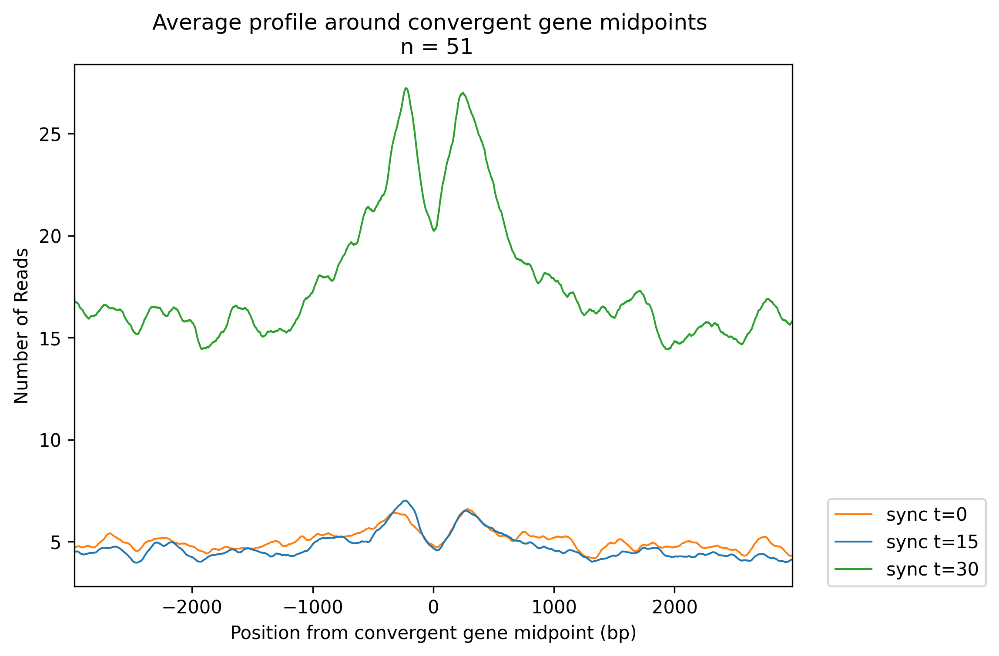

In [84]:
if plot_convergent_genes:  
    plot_data(
        data=mid_conv_gene_sample_avgs,
        start=-mid_conv_gene_filter,
        end=mid_conv_gene_filter,
        xsize=5.5,
        ysize=4,
        window_len=mid_conv_gene_window_len,
        xlabel='Position from convergent gene midpoint (bp)',
        title='Average profile around convergent gene midpoints',
        save_name='average_convergent_genepoint',
        include_num=True,
        sample_slices=mid_conv_gene_sample_slices
    )

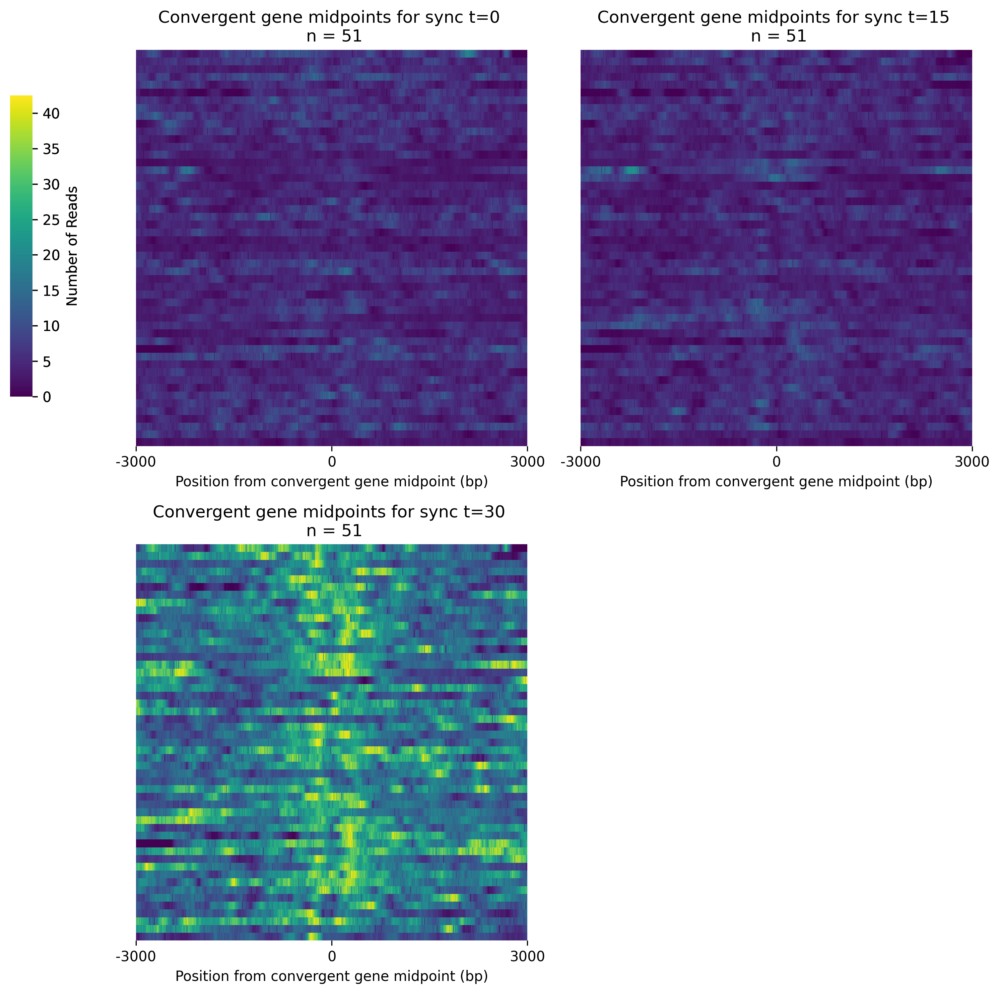

In [85]:
if plot_convergent_genes:    
    max_colorbar = 0
    for sample in mid_conv_gene_sample_slices:
        if mid_conv_gene_sample_slices[sample].max().max() > max_colorbar:
            max_colorbar = mid_conv_gene_sample_slices[sample].max().max()

if plot_convergent_genes:     
    heatmap_all_slices(
        data=mid_conv_gene_sample_slices, 
        title="Convergent gene midpoints",
        save_name="all_conv_midpoint_slices",
        figsize_x=4.5,
        figsize_y=5,
        min_colorbar=0,
        max_colorbar=max_colorbar,
        xticklabels=[-3000, 0, 3000],  #note end is the start of the gene on the -strand
        xlabel='Position from convergent gene midpoint (bp)'
    )

In [86]:
if plot_convergent_genes or plot_div_genes: 
    ORF_property = 'TR (mol/hour)'
    transcription_rates = pd.read_csv('transcription_rates.csv')
    transcription_rates.index=transcription_rates['Systematic name']
    ORF_df.index=ORF_df['Systematic_Name']
    ORF_TR = pd.concat([ORF_df, transcription_rates],axis=1)
    ORF_TR = ORF_TR[ORF_TR['Start'].notna()].reset_index(drop=True)
    ORF_TR = ORF_TR[ORF_TR[ORF_property].notna()].reset_index(drop=True)

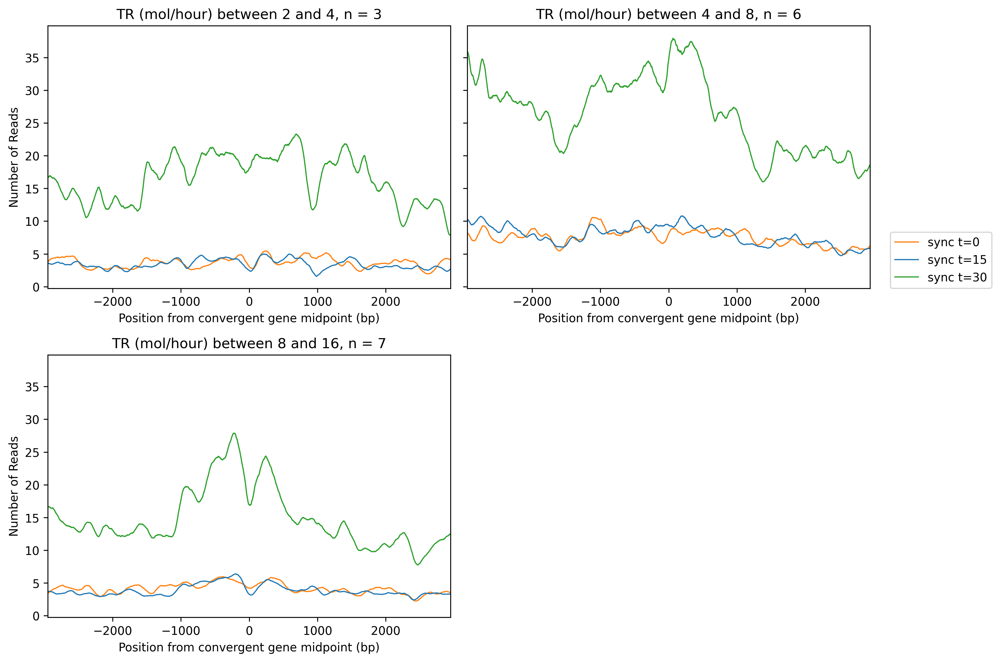

In [87]:
if plot_convergent_genes:  
    bin_convergent_genes = {}
    for n in range(len(TR_conv_gene_bins[:-1])):
        conv_gene_bin = {}
        for chromosome in {chromosome: "" for chromosome in chr_names}:
            chr_convergent_genes = pd.DataFrame()
            chr_ORF_data = ORF_TR[ORF_TR['Chromosome'] == chromosome].sort_values(by='Start', ignore_index=True)
            for i in range(len(chr_ORF_data)-1):
                if (chr_ORF_data['Strand'].iloc[i] == '1' 
                    and chr_ORF_data['Strand'].iloc[i+1] == '-1' 
                    and chr_ORF_data['End'].iloc[i] < chr_ORF_data['Start'].iloc[i+1]
                    and chr_ORF_data[ORF_property].iloc[i] > TR_conv_gene_bins[n] 
                    and chr_ORF_data[ORF_property].iloc[i] < TR_conv_gene_bins[n+1]
                    and chr_ORF_data[ORF_property].iloc[i+1] > TR_conv_gene_bins[n] 
                    and chr_ORF_data[ORF_property].iloc[i+1] < TR_conv_gene_bins[n+1]
                   ):
                    chr_convergent_genes = chr_convergent_genes.append(
                        [chr_ORF_data.iloc[i], chr_ORF_data.iloc[i+1]]
                    )
                    
                    #could add midpoint right here
            if not chr_convergent_genes.empty:
                conv_gene_bin[chromosome] = chr_convergent_genes
        if conv_gene_bin != {}:
            bin_convergent_genes[f'{TR_conv_gene_bins[n]}_to_{TR_conv_gene_bins[n+1]}'] = conv_gene_bin

    bin_conv_midpoint = {}
    for a_bin in bin_convergent_genes:
        bin_conv_midpoint[a_bin] = {}
        for chromosome in bin_convergent_genes[a_bin]:  #maybe if change to in chr_names
            bin_conv_midpoint[a_bin][chromosome] = []
            for start, end, start_1, end_1 in zip(
                bin_convergent_genes[a_bin][chromosome]['Start'].iloc[::2],
                bin_convergent_genes[a_bin][chromosome]['End'].iloc[::2],
                bin_convergent_genes[a_bin][chromosome]['Start'].iloc[1::2],
                bin_convergent_genes[a_bin][chromosome]['End'].iloc[1::2]):
                
                bin_conv_midpoint[a_bin][chromosome].append(int(end + (start_1-end)/2))
            bin_conv_midpoint[a_bin][chromosome] = pd.DataFrame(bin_conv_midpoint[a_bin][chromosome],columns=['Start'])
            
            
    for a_bin in bin_conv_midpoint:
        for chromosome in {chromosome: "" for chromosome in chr_names}:
            if chromosome not in bin_conv_midpoint[a_bin]:
                bin_conv_midpoint[a_bin][chromosome] = pd.DataFrame(columns=['Start'])
                

    bin_conv_midpoint_sliced_df = {}
    bin_conv_midpoint_sample_slices = {}
    bin_conv_midpoint_sample_avgs = {}
    for a_bin in bin_conv_midpoint:
        (conv_midpoint_sliced_df, conv_midpoint_sample_slices, 
         conv_midpoint_sample_avgs) = slice_data(
            df_chr_feature=bin_conv_midpoint[a_bin],
            pileup_df=df_processed_pileups,
            sample_chr=sample_chr,
            sample_names=sample_names,
            start_slice=-mid_conv_gene_filter,
            end_slice=mid_conv_gene_filter
            )

        bin_conv_midpoint_sliced_df[a_bin] = conv_midpoint_sliced_df
        bin_conv_midpoint_sample_slices[a_bin] = conv_midpoint_sample_slices
        bin_conv_midpoint_sample_avgs[a_bin] = conv_midpoint_sample_avgs
        
        if save_averaged_data:
            save_bin_conv_midpoint_sample_avgs = {}
            for a_bin in bin_conv_midpoint_sample_avgs:
                for sample in bin_conv_midpoint_sample_avgs[a_bin]: 
                    save_bin_conv_midpoint_sample_avgs[f'{sample}_bin_{a_bin}'] = bin_conv_midpoint_sample_avgs[a_bin][sample]

            save_bin_conv_midpoint_sample_avgs = pd.DataFrame(save_bin_conv_midpoint_sample_avgs)
            save_bin_conv_midpoint_sample_avgs.to_csv(join(path, "bin_conv_midpoint_sample_avgs.csv"))



    if len(bin_conv_midpoint_sample_avgs) == 1:
        nrows = 2
    else: 
        nrows = math.ceil(len(bin_conv_midpoint_sample_avgs)**0.5)
    fig,axes = plt.subplots(nrows, nrows, figsize=(nrows*6, nrows*4), dpi=300, sharey=True);
    list_idx = iter([num for num in range(nrows**2)])
    for a_bin in bin_conv_midpoint_sample_avgs:
        lower_val = a_bin.split('_to_')[0]
        upper_val = a_bin.split('_to_')[1]
        idx = next(list_idx)
        i = math.floor(idx/nrows)
        n = idx - i * nrows  
        for sample in bin_conv_midpoint_sample_avgs[a_bin]:
            individual_subplots(
                i=i,
                n=n,
                results=bin_conv_midpoint_sample_avgs[a_bin][sample],
                window_len=mid_conv_gene_window_len*2,
                start=-mid_conv_gene_filter,
                end=mid_conv_gene_filter,
                title=f'{ORF_property} between {lower_val} and {upper_val}, n = {len(bin_conv_midpoint_sample_slices[a_bin][sample].columns)}',
                xlabel='Position from convergent gene midpoint (bp)',
                label=f'{sample}',
                colour=sample_colour_dict[sample]
                )
            if n != 0: 
                axes[i][n].set_ylabel(None)
            if n != nrows - 1 or i != 0:
                axes[i][n].legend().set_visible(False)
    if len(bin_conv_midpoint_sample_avgs) < nrows**2:
        for num in range(nrows**2 - len(bin_conv_midpoint_sample_avgs)):
            idx = next(list_idx)
            i = math.floor(idx/nrows)
            n = idx - i * nrows
            fig.delaxes(axes[i][n])

    plt.tight_layout()
    fig.savefig(join(path,'TR_conv_midpoints.png'),bbox_inches='tight')

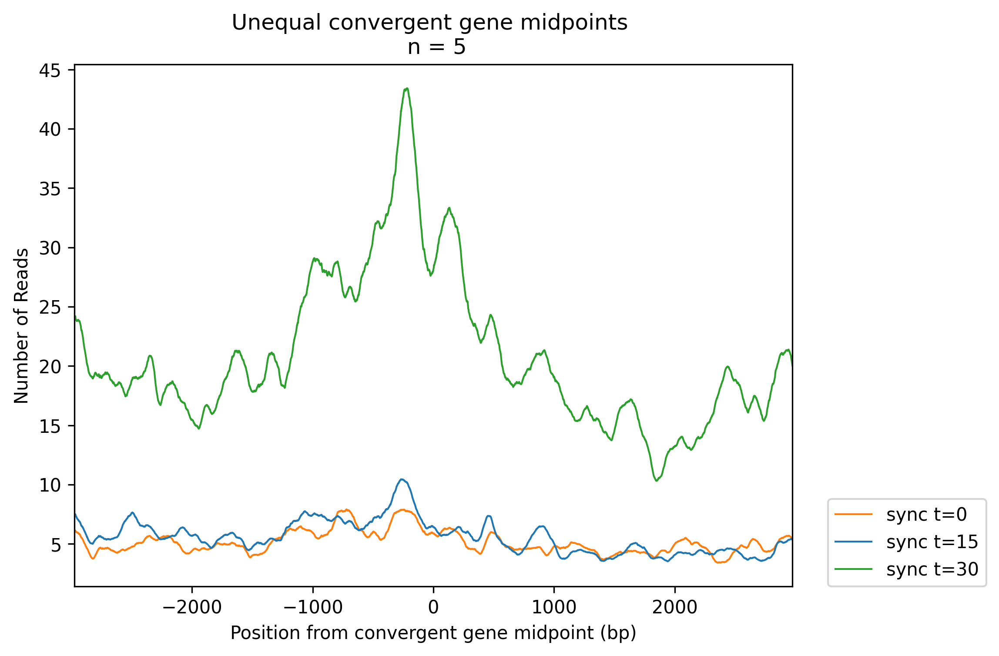

In [88]:
if plot_convergent_genes: 
    unequal_conv_gene = {}
    for chromosome in {chromosome: "" for chromosome in chr_names}:
        chr_convergent_genes = pd.DataFrame()
        chr_ORF_data = ORF_TR[ORF_TR['Chromosome'] == chromosome].sort_values(by='Start', ignore_index=True)
        for i in range(len(chr_ORF_data)-1):
            if (chr_ORF_data['Strand'].iloc[i] == '1' 
                and chr_ORF_data['Strand'].iloc[i+1] == '-1' 
                and chr_ORF_data['End'].iloc[i] < chr_ORF_data['Start'].iloc[i+1]
                and (
                    (
                        3 * chr_ORF_data[ORF_property].iloc[i] 
                        < chr_ORF_data[ORF_property].iloc[i+1] 
                    )
                    or (
                        chr_ORF_data[ORF_property].iloc[i] 
                        > 3 * chr_ORF_data[ORF_property].iloc[i+1]
                    )
                )
               ):
                chr_convergent_genes = chr_convergent_genes.append(
                    [chr_ORF_data.iloc[i], chr_ORF_data.iloc[i+1]]
                )

                #could add midpoint right here
        if not chr_convergent_genes.empty:
            unequal_conv_gene[chromosome] = chr_convergent_genes


    unequal_conv_midpoint = {}
    for chromosome in unequal_conv_gene: 
        unequal_conv_midpoint[chromosome] = []
        for i in range(0, len(unequal_conv_gene[chromosome])-1, 2):
            if unequal_conv_gene[chromosome][ORF_property].iloc[i] < unequal_conv_gene[chromosome][ORF_property].iloc[i+1]:
                unequal_conv_midpoint[chromosome].append([int(unequal_conv_gene[chromosome]['End'].iloc[i] + (unequal_conv_gene[chromosome]['Start'].iloc[i+1]-unequal_conv_gene[chromosome]['End'].iloc[i])/2), 'N'])
            elif unequal_conv_gene[chromosome][ORF_property].iloc[i] > unequal_conv_gene[chromosome][ORF_property].iloc[i+1]: 
                unequal_conv_midpoint[chromosome].append([int(unequal_conv_gene[chromosome]['End'].iloc[i] + (unequal_conv_gene[chromosome]['Start'].iloc[i+1]-unequal_conv_gene[chromosome]['End'].iloc[i])/2), 'Y'])
            else:
                print('There is a problem with binning')
        unequal_conv_midpoint[chromosome] = pd.DataFrame(unequal_conv_midpoint[chromosome],columns=['Start', 'Invert'])
    #flip data when 1 stronger so that all the data has the same orientation with the less expressed gene on the left and the more expressed gene on the right
            
            
    for chromosome in {chromosome: "" for chromosome in chr_names}:
        if chromosome not in unequal_conv_midpoint:
            unequal_conv_midpoint[chromosome] = pd.DataFrame(columns=['Start'])
                

    (unequal_conv_midpoint_sliced_df, unequal_conv_midpoint_sample_slices, 
     unequal_conv_midpoint_sample_avgs) = slice_data(
        df_chr_feature=unequal_conv_midpoint,
        pileup_df=df_processed_pileups,
        sample_chr=sample_chr,
        sample_names=sample_names,
        start_slice=-mid_conv_gene_filter,
        end_slice=mid_conv_gene_filter,
        end_col='Start'
        )
    
    plot_data(
        data=unequal_conv_midpoint_sample_avgs,
        start=-mid_conv_gene_filter,
        end=mid_conv_gene_filter,
        xsize=5.5,
        ysize=4,
        window_len=mid_conv_gene_window_len,
        xlabel='Position from convergent gene midpoint (bp)',
        title='Unequal convergent gene midpoints',
        save_name='average_unequal_convergent_genepoint',
        include_num=True,
        sample_slices=unequal_conv_midpoint_sample_slices
    )

###  Fraction of cohesin pool at convergent gene midpoints

In [89]:
if plot_convergent_genes: 
    midpoint_window = 750
    print('Percent of cohesin at convergent gene midpoints for:')
    for sample in mid_conv_gene_sample_avgs:
        print(f'{sample} = {100*(mid_conv_gene_sample_avgs[sample].loc[-midpoint_window:midpoint_window].sum()*len(mid_conv_gene_sample_slices[sample].columns))/df_processed_pileups[sample].sum().sum()}')
    
    total_positions = 0
    for chromosome in set(chr_names):
        total_positions += chr_lens[chromosome]
    print(f'Percent of genomic positions at within window around convergent gene midpoints = {(100*len(mid_conv_gene_sample_avgs[sample].loc[-midpoint_window:midpoint_window])*len(mid_conv_gene_sample_slices[sample].columns))/total_positions}')


Percent of cohesin at convergent gene midpoints for:
sync_t=0_IP = 20.302439938852423
sync_t=15_IP = 19.97225577834537
sync_t=30_IP = 22.27099930345376
Percent of genomic positions at within window around convergent gene midpoints = 13.998844264663392


### Divergent genes

In [90]:
if plot_div_genes:
    print("Analysing Occupancy Across Divergent Genes")
    div_genes = {}
    for chromosome in ORF_data:
        chr_div_genes = pd.DataFrame()
        chr_ORF_data = ORF_data[chromosome]
        for i in range(len(ORF_data[chromosome])-1):
            if (chr_ORF_data['Strand'].iloc[i] == '-1' 
                and chr_ORF_data['Strand'].iloc[i+1] == '1' 
                and chr_ORF_data['End'].iloc[i] < chr_ORF_data['Start'].iloc[i+1]):
                chr_div_genes = chr_div_genes.append(
                    [chr_ORF_data.iloc[i], chr_ORF_data.iloc[i+1]]
                )
                
        #chr_div_genes = chr_convergent_genes.reset_index(drop=True)
        div_genes[chromosome] = chr_div_genes

Analysing Occupancy Across Divergent Genes


In [91]:
if plot_div_genes:    
    div_midpoint = {}
    for chromosome in div_genes:
        div_midpoint[chromosome] = []
        for start, end, start_1, end_1 in zip(
            div_genes[chromosome]['Start'].iloc[::2],
            div_genes[chromosome]['End'].iloc[::2],
            div_genes[chromosome]['Start'].iloc[1::2],
            div_genes[chromosome]['End'].iloc[1::2]):
            #start is the stop codon of the ORF on the -1 strand
            #end is the start codon of the ORF on the -1 strand
            div_midpoint[chromosome].append(int(end + (start_1-end)/2))
            #position of midpoint on the chromosome is the position of the start codon of the 
            #ORF on the -1 strand plus half of the inter-div gene length
        div_midpoint[chromosome] = pd.DataFrame(div_midpoint[chromosome],columns=['Start'])

In [92]:
if plot_div_genes:
    (mid_div_gene_sliced_df, mid_div_gene_sample_slices, 
     mid_div_gene_sample_avgs) = slice_data(
        df_chr_feature=div_midpoint,
        pileup_df=df_processed_pileups,
        sample_chr=sample_chr,
        sample_names=sample_names,
        start_slice=-mid_div_gene_filter,
        end_slice=mid_div_gene_filter
        )
    if save_averaged_data:
        mid_div_gene_sample_avgs_df = pd.DataFrame(mid_div_gene_sample_avgs)
        mid_div_gene_sample_avgs_df.to_csv(
            join(path, "mid_div_gene_sample_avgs.csv")
        )

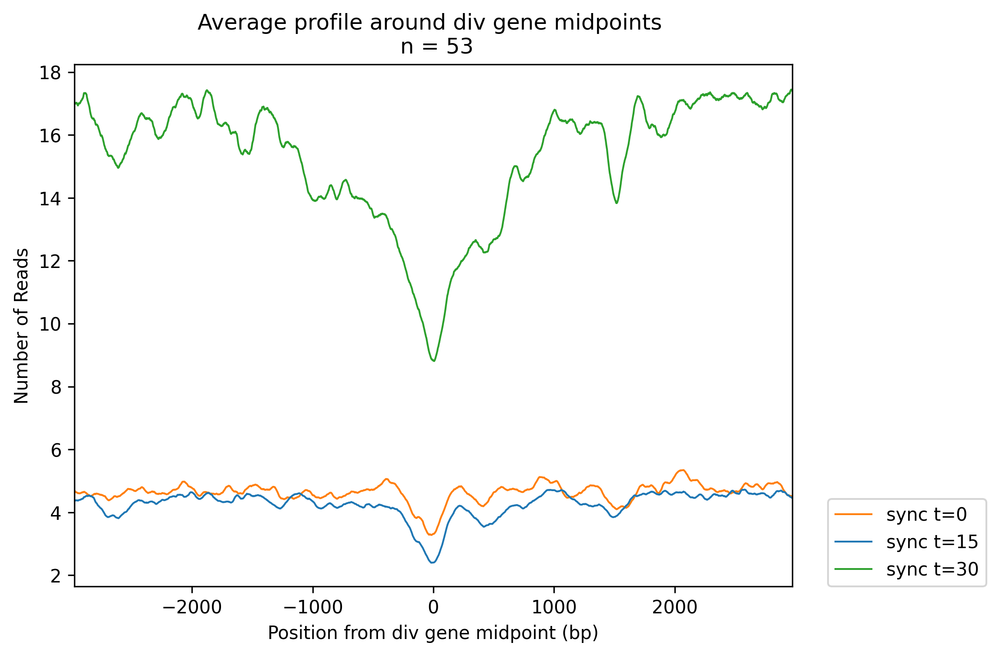

In [93]:
if plot_div_genes:  
    plot_data(
        data=mid_div_gene_sample_avgs,
        start=-mid_div_gene_filter,
        end=mid_div_gene_filter,
        xsize=5.5,
        ysize=4,
        window_len=mid_div_gene_window_len,
        xlabel='Position from div gene midpoint (bp)',
        title='Average profile around div gene midpoints',
        save_name='average_div_genepoint',
        include_num=True,
        sample_slices=mid_div_gene_sample_slices
    )

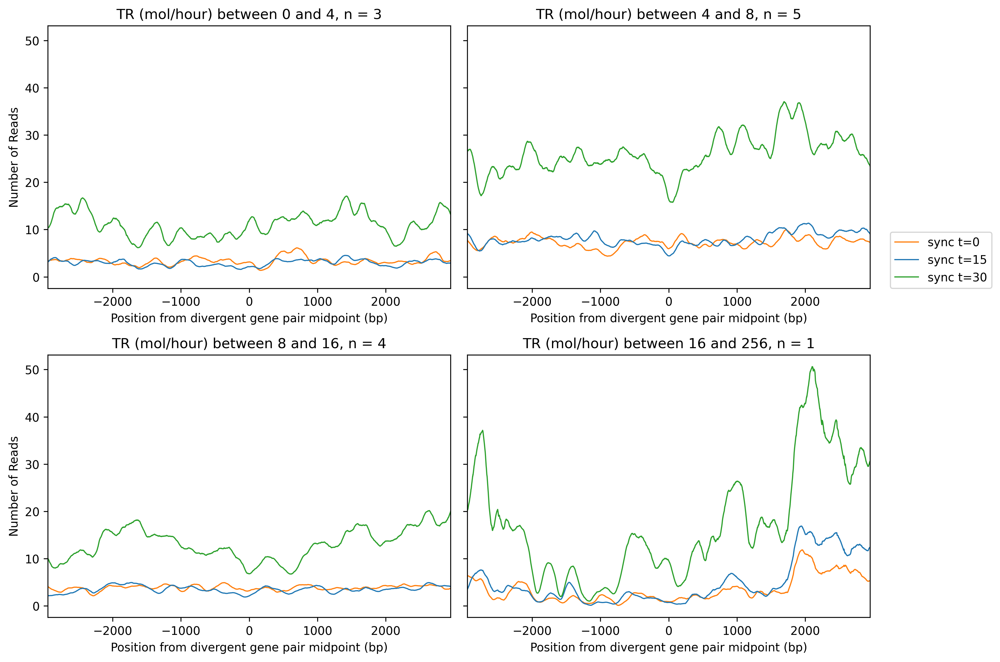

In [94]:
if plot_div_genes:
    bin_div_genes = {}
    for n in range(len(TR_div_gene_bins[:-1])):
        div_gene_bin = {}
        for chromosome in {chromosome: "" for chromosome in chr_names}:
            chr_div_genes = pd.DataFrame()
            chr_ORF_data = ORF_TR[ORF_TR['Chromosome'] == chromosome].sort_values(by='Start', ignore_index=True)
            for i in range(len(chr_ORF_data)-1):
                if (chr_ORF_data['Strand'].iloc[i] == '-1' 
                    and chr_ORF_data['Strand'].iloc[i+1] == '1' 
                    and chr_ORF_data['End'].iloc[i] < chr_ORF_data['Start'].iloc[i+1]
                    and chr_ORF_data[ORF_property].iloc[i] > TR_div_gene_bins[n] 
                    and chr_ORF_data[ORF_property].iloc[i] < TR_div_gene_bins[n+1]
                    and chr_ORF_data[ORF_property].iloc[i+1] > TR_div_gene_bins[n] 
                    and chr_ORF_data[ORF_property].iloc[i+1] < TR_div_gene_bins[n+1]
                   ):
                    chr_div_genes = chr_div_genes.append(
                        [chr_ORF_data.iloc[i], chr_ORF_data.iloc[i+1]]
                    )
                    
                    #could add midpoint right here
            if not chr_div_genes.empty:
                div_gene_bin[chromosome] = chr_div_genes
        if div_gene_bin != {}:
            bin_div_genes[f'{TR_div_gene_bins[n]}_to_{TR_div_gene_bins[n+1]}'] = div_gene_bin

    bin_div_midpoint = {}
    for a_bin in bin_div_genes:
        bin_div_midpoint[a_bin] = {}
        for chromosome in bin_div_genes[a_bin]:  #maybe if change to in chr_names
            bin_div_midpoint[a_bin][chromosome] = []
            for start, end, start_1, end_1 in zip(
                bin_div_genes[a_bin][chromosome]['Start'].iloc[::2],
                bin_div_genes[a_bin][chromosome]['End'].iloc[::2],
                bin_div_genes[a_bin][chromosome]['Start'].iloc[1::2],
                bin_div_genes[a_bin][chromosome]['End'].iloc[1::2]):
                
                bin_div_midpoint[a_bin][chromosome].append(int(end + (start_1-end)/2))
            bin_div_midpoint[a_bin][chromosome] = pd.DataFrame(bin_div_midpoint[a_bin][chromosome],columns=['Start'])
            
            
    for a_bin in bin_div_midpoint:
        for chromosome in {chromosome: "" for chromosome in chr_names}:
            if chromosome not in bin_div_midpoint[a_bin]:
                bin_div_midpoint[a_bin][chromosome] = pd.DataFrame(columns=['Start'])
                

    bin_div_midpoint_sliced_df = {}
    bin_div_midpoint_sample_slices = {}
    bin_div_midpoint_sample_avgs = {}
    for a_bin in bin_div_midpoint:
        (div_midpoint_sliced_df, div_midpoint_sample_slices, 
         div_midpoint_sample_avgs) = slice_data(
            df_chr_feature=bin_div_midpoint[a_bin],
            pileup_df=df_processed_pileups,
            sample_chr=sample_chr,
            sample_names=sample_names,
            start_slice=-mid_div_gene_filter,
            end_slice=mid_div_gene_filter
            )

        bin_div_midpoint_sliced_df[a_bin] = div_midpoint_sliced_df
        bin_div_midpoint_sample_slices[a_bin] = div_midpoint_sample_slices
        bin_div_midpoint_sample_avgs[a_bin] = div_midpoint_sample_avgs
        
        if save_averaged_data:
            save_bin_div_midpoint_sample_avgs = {}
            for a_bin in bin_div_midpoint_sample_avgs:
                for sample in bin_div_midpoint_sample_avgs[a_bin]: 
                    save_bin_div_midpoint_sample_avgs[f'{sample}_bin_{a_bin}'] = bin_div_midpoint_sample_avgs[a_bin][sample]

            save_bin_div_midpoint_sample_avgs = pd.DataFrame(save_bin_div_midpoint_sample_avgs)
            save_bin_div_midpoint_sample_avgs.to_csv(join(path, "bin_div_midpoint_sample_avgs.csv"))



    if len(bin_div_midpoint_sample_avgs) == 1:
        nrows = 2
    else: 
        nrows = math.ceil(len(bin_div_midpoint_sample_avgs)**0.5)
    fig,axes = plt.subplots(nrows, nrows, figsize=(nrows*6, nrows*4), dpi=300, sharey=True);
    list_idx = iter([num for num in range(nrows**2)])
    for a_bin in bin_div_midpoint_sample_avgs:
        lower_val = a_bin.split('_to_')[0]
        upper_val = a_bin.split('_to_')[1]
        idx = next(list_idx)
        i = math.floor(idx/nrows)
        n = idx - i * nrows  
        for sample in bin_div_midpoint_sample_avgs[a_bin]:
            individual_subplots(
                i=i,
                n=n,
                results=bin_div_midpoint_sample_avgs[a_bin][sample],
                window_len=100,
                start=-mid_div_gene_filter,
                end=mid_div_gene_filter,
                title=f'{ORF_property} between {lower_val} and {upper_val}, n = {len(bin_div_midpoint_sample_slices[a_bin][sample].columns)}',
                xlabel='Position from divergent gene pair midpoint (bp)',
                label=f'{sample}',
                colour=sample_colour_dict[sample]
                )
            if n != 0: 
                axes[i][n].set_ylabel(None)
            if n != nrows - 1 or i != 0:
                axes[i][n].legend().set_visible(False)
    if len(bin_div_midpoint_sample_avgs) < nrows**2:
        for num in range(nrows**2 - len(bin_div_midpoint_sample_avgs)):
            idx = next(list_idx)
            i = math.floor(idx/nrows)
            n = idx - i * nrows
            fig.delaxes(axes[i][n])

    plt.tight_layout()
    fig.savefig(join(path,'TR_div_midpoints.png'),bbox_inches='tight')

#### tRNA
Plot around the starts, ends and across tRNA genes

In [95]:
if plot_tRNA_genes:  
    print("Analysing Occupancy Across tRNA Genes")
    tRNA_df = SGD_df[SGD_df['Type'] == 'tRNA gene']

    tRNA_data = {}
    for chromosome in {chromosome: "" for chromosome in chr_names}:
        tRNA_data[chromosome] = (
            tRNA_df[tRNA_df['Chromosome'] == chromosome].
            sort_values(by='Start', ignore_index=True)
            )

Analysing Occupancy Across tRNA Genes


In [96]:
if plot_tRNA_genes:      
    (tRNA_5_prime_sliced_df, tRNA_5_prime_sample_slices, 
     tRNA_5_prime_sample_avgs) = slice_data(
        df_chr_feature=tRNA_data,
        pileup_df=df_processed_pileups,
        sample_chr=sample_chr,
        sample_names=sample_names,
        start_slice=tRNA_5_prime_start_slice,
        end_slice=tRNA_5_prime_end_slice
        )
    if save_averaged_data:
        tRNA_5_prime_sample_avgs_df = pd.DataFrame(tRNA_5_prime_sample_avgs)
        tRNA_5_prime_sample_avgs_df.to_csv(
            join(path, "tRNA_5_prime_sample_avgs.csv")
        )

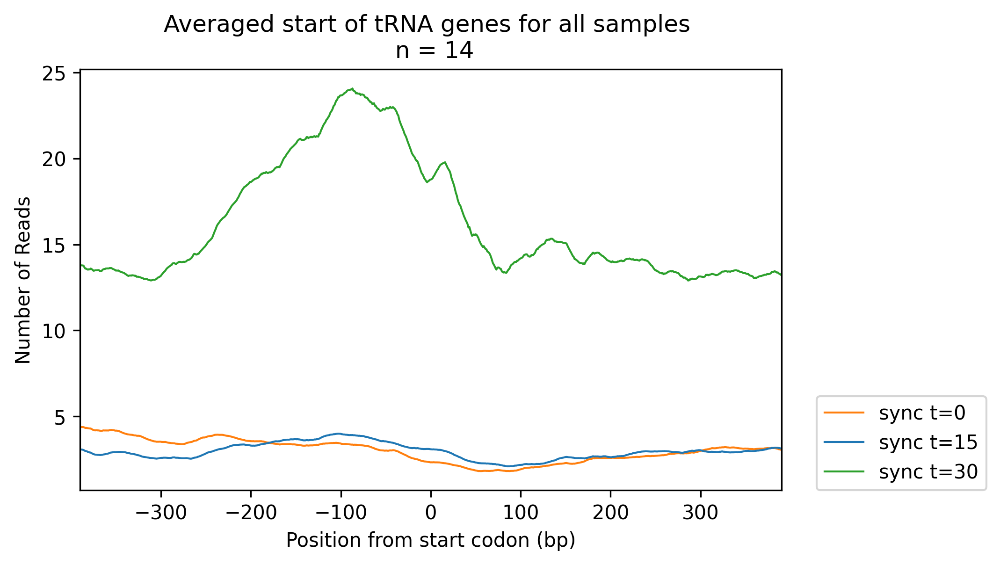

In [97]:
if plot_tRNA_genes:      
    plot_data(
        data=tRNA_5_prime_sample_avgs,
        start=tRNA_5_prime_start_slice,
        end=tRNA_5_prime_end_slice,
        window_len=tRNA_window_len,
        title='Averaged start of tRNA genes for all samples',
        xlabel='Position from start codon (bp)',
        save_name='aligned_on_tRNA_TSSs',
        sample_slices=tRNA_5_prime_sample_slices,
        xsize=5
    )

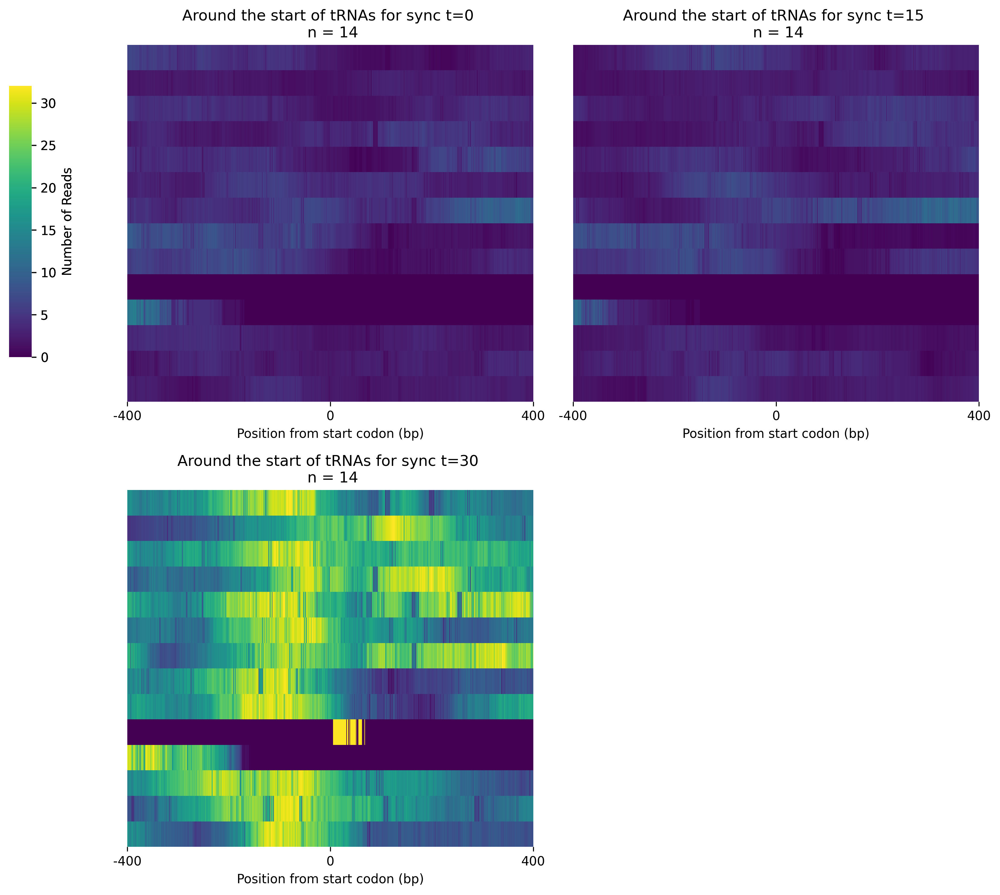

In [98]:
if plot_tRNA_genes:    
    max_colorbar = 0
    for sample in tRNA_5_prime_sample_slices:
        if tRNA_5_prime_sample_slices[sample].max().max() > max_colorbar:
            max_colorbar = tRNA_5_prime_sample_slices[sample].max().max()

    heatmap_all_slices(
        data=tRNA_5_prime_sample_slices, 
        title=f"Around the start of tRNAs", 
        save_name="around_tRNA_TSS_slices",
        min_colorbar=0,
        max_colorbar=max_colorbar,
        xticklabels=[tRNA_5_prime_start_slice, 0, tRNA_5_prime_end_slice],
        xlabel='Position from start codon (bp)',
        figsize_x=5,
        figsize_y=5
        )

In [99]:
if plot_tRNA_genes:      
    (tRNA_3_prime_sliced_df, tRNA_3_prime_sample_slices, 
     tRNA_3_prime_sample_avgs) = slice_data(
        df_chr_feature=tRNA_data,
        pileup_df=df_processed_pileups,
        sample_chr=sample_chr,
        sample_names=sample_names,
        start_slice=tRNA_3_prime_start_slice,
        end_slice=tRNA_3_prime_end_slice,
        start_col='End',
        end_col='Start'
        )
    if save_averaged_data:
        tRNA_3_prime_sample_avgs_df = pd.DataFrame(tRNA_3_prime_sample_avgs)
        tRNA_3_prime_sample_avgs_df.to_csv(
            join(path, "tRNA_3_prime_sample_avgs.csv")
        )

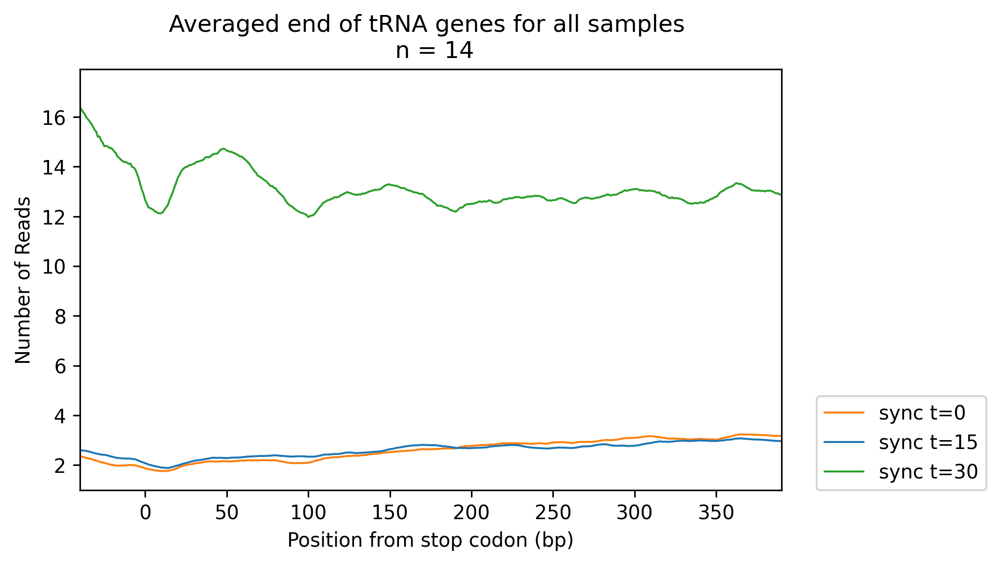

In [100]:
if plot_tRNA_genes:  
    plot_data(
        data=tRNA_3_prime_sample_avgs,
        start=tRNA_3_prime_start_slice,
        end=tRNA_3_prime_end_slice,
        window_len=tRNA_window_len,
        title='Averaged end of tRNA genes for all samples',
        xlabel='Position from stop codon (bp)',
        save_name='aligned_on_tRNA_TESs',
        sample_slices=tRNA_3_prime_sample_slices,
        xsize=5
    )

In [101]:
if plot_tRNA_genes:      
    (tRNA_sliced_df, tRNA_sample_slices, 
     tRNA_sample_avgs) = slice_data(
        df_chr_feature=tRNA_data,
        pileup_df=df_processed_pileups,
        sample_chr=sample_chr,
        sample_names=sample_names,
        relative=True,
        whole_slice=True,
        bins=tRNA_gene_bins,
        include_len=True,
        )
    if save_averaged_data:
        tRNA_sample_avgs_df = pd.DataFrame(tRNA_sample_avgs)
        tRNA_sample_avgs_df.to_csv(join(path, "tRNA_sample_avgs.csv"))

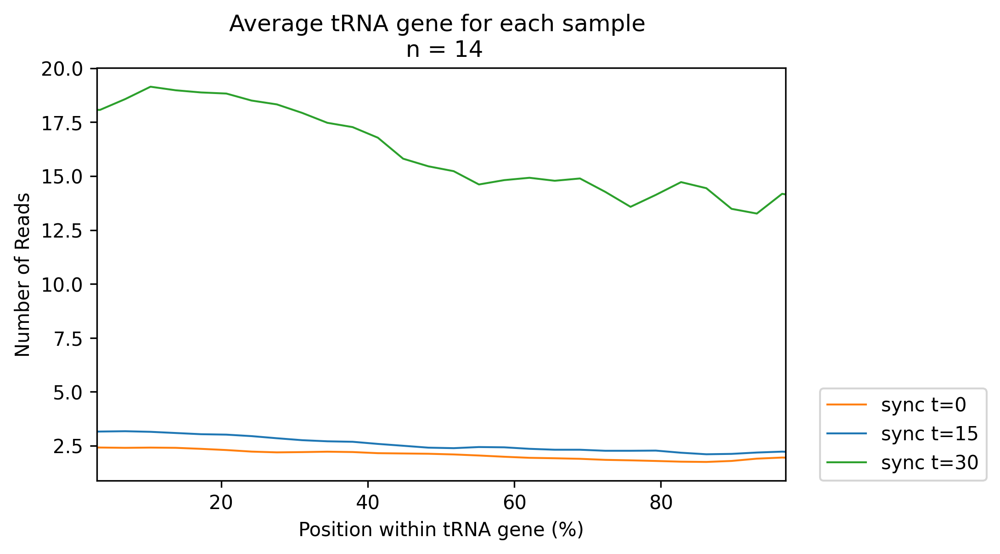

In [102]:
if plot_tRNA_genes:      
    plot_data(
        data=tRNA_sample_avgs,
        start=0,
        end=100,
        binned=True,
        num_bins=tRNA_gene_bins,
        window_len=tRNA_gene_window_len,
        title='Average tRNA gene for each sample',
        xlabel='Position within tRNA gene (%)',
        save_name='average_tRNA_gene', 
        sample_slices=tRNA_sample_slices,
        xsize=5
    )

In [103]:
print('Finished Analysis')

Finished Analysis
